In [1]:
# Python ≥3.5 is required, this cell ensures all required packages are imported and a GPU is detected (if available).
import sys
assert sys.version_info >= (3, 5)

# Is this notebook running on Colab or Kaggle?
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

#if not tf.config.list_physical_devices('GPU'): # GPU detection
#    print("No GPU was detected. CNNs can be very slow without a GPU.")
#    if IS_COLAB:
#        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
#    if IS_KAGGLE:
#        print("Go to Settings > Accelerator and select GPU.")
        

# Common imports
import numpy as np
import os, sys
import pandas as pd
import glob
import cv2
import matplotlib.pyplot as plt
from matplotlib import image
from matplotlib import pyplot
import json
import PIL.Image
import pathlib
import pickle
import random
from tensorflow import keras as K
import h5py
import random
import torch
import os
from IPython.display import Image, clear_output  # to display images
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# To make this notebook's output stable across runs 
np.random.seed(788203)
tf.random.set_seed(788203)
random.seed(788203)

In [4]:
# Clone YOLOv5
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 12384, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 12384 (delta 0), reused 3 (delta 0), pack-reused 12380
Receiving objects: 100% (12384/12384), 11.57 MiB | 11.06 MiB/s, done.
Resolving deltas: 100% (8619/8619), done.
/home/dll/.local/share/Trash/files/yolov5/yolov5
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [5]:
# Start YOLOv5
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [6]:
# Set up environment
os.environ["DATASET_DIRECTORY"] = "/home/dll/Documents/Syd/YOLO/datasets/"

In [44]:
# Download dataset from RoboFlow
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="UsA4cQ7EMkFfTfp6NopR")
project = rf.workspace("syd-proom").project("object-detector-xizkm")
dataset = project.version(6).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Extracting Dataset Version Zip to /home/dll/Documents/Syd/YOLO/datasets//object-detector-6 in yolov5pytorch:: 100%|██████████| 25232/25232 [00:01<00:00, 13597.77it/s]


### Train Model

In [49]:
!python train.py --img 416 --batch 256 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/home/dll/Documents/Syd/YOLO/datasets/object-detector-6/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=256, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 24 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-80-g4d157f5 torch 1.9.0+cu111 CUDA:0 (NVIDIA RTX A6000, 48685MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0,


     Epoch   gpu_mem       box       obj       cls    labels  img_size
      2/99     27.1G   0.06985   0.02801   0.01384       670       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.606      0.212      0.151     0.0488

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      3/99     27.1G   0.05908   0.02698   0.01219       612       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359       0.61      0.234       0.18     0.0614

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      4/99     27.1G   0.05385   0.02648   0.01087       758       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.714      0.216      0.216     0.0776

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.829      0.415      0.475      0.202

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     28/99     27.1G   0.04006   0.02272  0.004981       594       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.838      0.417      0.478      0.228

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     29/99     27.1G   0.03979    0.0227  0.004945       700       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.803      0.428       0.47      0.219

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     30/99     27.1G   0.04012    0.0228  0.004818       599       416: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
     53/99     27.1G   0.03662   0.02127  0.003811       675       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.879      0.448      0.528      0.259

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     54/99     27.1G   0.03635   0.02155  0.003781       661       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.856      0.479      0.557      0.268

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     55/99     27.1G   0.03591   0.02106  0.003754       489       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.782      0.497      0.551      0.271

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.787      0.557      0.594      0.294

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     79/99     27.1G   0.03308   0.01963  0.003081       690       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.784      0.565      0.593      0.301

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     80/99     27.1G   0.03275   0.01945  0.003013       627       416: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all       1717      11359      0.791      0.579      0.613      0.308

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     81/99     27.1G   0.03274   0.01952  0.002986       603       416: 100%|███
               Class     Images     L

Results saved to runs/train/exp8


In [52]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [54]:
!python detect.py --weights runs/train/exp8/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images --line-thickness 1

detect: weights=['runs/train/exp8/weights/best.pt'], source=/home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-80-g4d157f5 torch 1.9.0+cu111 CUDA:0 (NVIDIA RTX A6000, 48685MiB)

Fusing layers... 
Model summary: 213 layers, 7039792 parameters, 0 gradients, 15.9 GFLOPs
image 1/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478019960189614397_jpg.rf.e02689a5aba14897faca4d4e1f9a4c91.jpg: 416x416 4 cars, Done. (0.007s)
image 2/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478019960680764792_jpg.rf.614343c8e8824764901a6ba0fdba52f9

image 39/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020327699839481_jpg.rf.9412b84c13ac4eecefa39c5e4551fc73.jpg: 416x416 1 trafficLight-Red, Done. (0.007s)
image 40/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020328701570552_jpg.rf.b672c7990e957eef41d9c82c38ee0b8b.jpg: 416x416 5 cars, 1 pedestrian, 1 trafficLight-Red, Done. (0.007s)
image 41/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020330702034893_jpg.rf.4011190a4109a6d3102050a4d7ff2279.jpg: 416x416 8 cars, 2 pedestrians, Done. (0.007s)
image 42/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020335202316714_jpg.rf.c6948f53a199191a8dc19042177c5a56.jpg: 416x416 3 cars, Done. (0.006s)
image 43/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020350194803939_jpg.rf.79916ea3194456332490b88cf85abd8c.jpg: 416x416 3 cars, 2 trafficLight-Reds, Done. (0.007s)
image 44/1717 /home/dll

image 80/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020522700300712_jpg.rf.7db77ddca394a1c4a09099ac10350110.jpg: 416x416 1 car, Done. (0.006s)
image 81/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020523199498775_jpg.rf.a9824dcbda485b58fba52012992be5d9.jpg: 416x416 2 cars, Done. (0.007s)
image 82/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020526208201390_jpg.rf.ea909859169c471d9ecdd98bded70e47.jpg: 416x416 3 cars, Done. (0.007s)
image 83/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020528700390619_jpg.rf.a4d8a31b884350b19d1b4384e473363f.jpg: 416x416 6 cars, 1 trafficLight-Green, Done. (0.007s)
image 84/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020530207302126_jpg.rf.faa98e1a5efe19717b73c0e9ae5ba295.jpg: 416x416 4 cars, Done. (0.007s)
image 85/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1

image 124/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020841211342195_jpg.rf.9652117f82db1353a153f4b38e7121c1.jpg: 416x416 7 cars, 3 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.007s)
image 125/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020845718281360_jpg.rf.73ae0a75dbd5259cc8c1c2558af48b51.jpg: 416x416 10 cars, 3 trafficLight-Greens, 1 trafficLight-RedLeft, Done. (0.007s)
image 126/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020848711037747_jpg.rf.f257e6b9adab3717f48940d36cc40458.jpg: 416x416 10 cars, 3 trafficLight-Greens, 1 trafficLight-RedLeft, Done. (0.007s)
image 127/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478020849719184586_jpg.rf.b480be0606eca0ea80aec511498da4a2.jpg: 416x416 7 cars, 3 trafficLight-Greens, 1 trafficLight-RedLeft, Done. (0.006s)
image 128/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/14780208

image 169/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021052225046709_jpg.rf.c93e350bac5c323a6da9dfaee620467d.jpg: 416x416 6 cars, Done. (0.006s)
image 170/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021140221546401_jpg.rf.86457604ad1c0014038b2b5135df705d.jpg: 416x416 5 cars, 1 truck, Done. (0.007s)
image 171/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021144222210109_jpg.rf.4984d3d442a989228c2da2754dd2f881.jpg: 416x416 2 cars, 2 trucks, Done. (0.007s)
image 172/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021146223300141_jpg.rf.30bb031153230262fcc14c30bbde114b.jpg: 416x416 1 car, Done. (0.006s)
image 173/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021151224991193_jpg.rf.c3791d1416c7d6eedbce41a35a97a6bc.jpg: 416x416 5 cars, Done. (0.007s)
image 174/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/image

image 216/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478021933083430163_jpg.rf.166237c7695ef1d0e38a130f3c6978a2.jpg: 416x416 12 cars, Done. (0.007s)
image 217/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478022254600444299_jpg.rf.e47cf8314250355dcf6ed92cbf695174.jpg: 416x416 6 cars, Done. (0.007s)
image 218/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478022264093290678_jpg.rf.248edb3c014538ae431294aea15497c0.jpg: 416x416 6 cars, 2 pedestrians, Done. (0.007s)
image 219/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478022267595100831_jpg.rf.97f42096f0a8a069bf9ddc007b6a9b09.jpg: 416x416 4 cars, 1 truck, Done. (0.007s)
image 220/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478731889693455924_jpg.rf.fc36179b6e0b6a43d2fdf45cfb01edf0.jpg: 416x416 9 cars, Done. (0.006s)
image 221/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/vali

image 259/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732075502801370_jpg.rf.3ff05cbcc73a44c89c0d90222d1b9c41.jpg: 416x416 3 cars, 3 pedestrians, Done. (0.006s)
image 260/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732084678476962_jpg.rf.cf481609f75e76bd2674951c14e796aa.jpg: 416x416 3 cars, 1 trafficLight-GreenLeft, 1 trafficLight-Yellow, Done. (0.007s)
image 261/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732085825466179_jpg.rf.382176bfa64729c446069e984fe9a1db.jpg: 416x416 12 cars, 2 trafficLight-Yellows, Done. (0.007s)
image 262/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732098441526925_jpg.rf.e56504093ace9407bf8e3f0bebb4ef5b.jpg: 416x416 5 cars, 2 trafficLights, 3 trafficLight-Reds, Done. (0.007s)
image 263/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732103602413393_jpg.rf.2bb735f71ad6fbc19888a9690c13db21.jpg: 416x

image 297/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732280236519100_jpg.rf.e62fd4d7f7d64f68ce004fabc8d127b9.jpg: 416x416 5 cars, Done. (0.007s)
image 298/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732280809419544_jpg.rf.8a17ee0c0cae368d8c44305f1b6fe84c.jpg: 416x416 6 cars, Done. (0.007s)
image 299/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732283104188492_jpg.rf.4c1d37dccb53701f6f6b7ee261f7d9e5.jpg: 416x416 9 cars, Done. (0.007s)
image 300/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732293426400685_jpg.rf.e87aa527cb5a05795babf0d6a2924765.jpg: 416x416 8 cars, Done. (0.007s)
image 301/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732293999581903_jpg.rf.012789d48a58205b9fd0f77f7960a1a5.jpg: 416x416 10 cars, Done. (0.007s)
image 302/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/147873229514623

image 341/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732504467962348_jpg.rf.b6f0a36b913ab979e09afe13367dc0e9.jpg: 416x416 8 cars, Done. (0.007s)
image 342/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732509629447783_jpg.rf.679f6fba482257fd583c62c0f62a6fe1.jpg: 416x416 6 cars, Done. (0.007s)
image 343/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732513071153506_jpg.rf.50b4196beb6c4aaec38717abb95ca7ad.jpg: 416x416 7 cars, Done. (0.007s)
image 344/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732514217765627_jpg.rf.5fd59f5851d33705102672c759c9a3d5.jpg: 416x416 9 cars, Done. (0.006s)
image 345/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732517658846474_jpg.rf.bb3e43915d6b7327b11385d8e18b9d78.jpg: 416x416 10 cars, Done. (0.006s)
image 346/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/147873251823151

image 387/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732727552620374_jpg.rf.73a7e9c97fbdc251f28cdee0760a7aa3.jpg: 416x416 7 cars, Done. (0.007s)
image 388/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732729273274199_jpg.rf.5d10d9d109a212315b7e0effedd97ffd.jpg: 416x416 7 cars, 1 truck, Done. (0.007s)
image 389/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732730420209239_jpg.rf.9d380ee4e7be282f7b198a69a0673cea.jpg: 416x416 9 cars, Done. (0.007s)
image 390/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732737875252756_jpg.rf.f3ff7a25a672e1c597c17e287d197b3f.jpg: 416x416 5 cars, Done. (0.007s)
image 391/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732740743279101_jpg.rf.21eeeb868cfdfca2b4a61f44c9255fbf.jpg: 416x416 7 cars, 1 trafficLight-Green, Done. (0.007s)
image 392/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-

image 427/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732951784880409_jpg.rf.662e197758cd90964e0bdcc2fe03aeb0.jpg: 416x416 7 cars, Done. (0.008s)
image 428/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732959239888095_jpg.rf.b9b2b94e3585e6a6a876708b3c808846.jpg: 416x416 8 cars, Done. (0.007s)
image 429/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732966695979242_jpg.rf.1696c17d29143ae83a2188fa957b1872.jpg: 416x416 5 cars, Done. (0.007s)
image 430/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732971857193116_jpg.rf.f10d9d4436648d5b439002c06b3abd27.jpg: 416x416 5 cars, Done. (0.007s)
image 431/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732975297354654_jpg.rf.e9f2d4c7bb92b8b6a1e9319dce740413.jpg: 416x416 7 cars, Done. (0.007s)
image 432/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478732978165601

image 475/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895370457935289_jpg.rf.4805a887d5fcc87eb16e34e7f575457d.jpg: 416x416 1 car, Done. (0.007s)
image 476/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895371602508405_jpg.rf.b8a54e55ecb181576939c1d438489076.jpg: 416x416 1 car, Done. (0.006s)
image 477/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895373885982481_jpg.rf.b6c7bfc65ddd243ab1e4a3087ec28378.jpg: 416x416 1 car, Done. (0.007s)
image 478/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895379028198070_jpg.rf.aa95c0beea1ac4b6e047d186cb48835f.jpg: 416x416 1 car, Done. (0.007s)
image 479/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895397309857646_jpg.rf.d94f11b603def364907197e058e2a3b7.jpg: 416x416 Done. (0.006s)
image 480/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895399594026807_jpg.rf.2

image 524/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895602973112527_jpg.rf.858e5a05e9147f67cccd489289896448.jpg: 416x416 Done. (0.006s)
image 525/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895605259437011_jpg.rf.9fcc49fab12d0b9dda3c223241b36009.jpg: 416x416 Done. (0.006s)
image 526/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895613827719260_jpg.rf.f0aa8c169b72436ddc1fc414a23a2733.jpg: 416x416 Done. (0.007s)
image 527/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895616112533262_jpg.rf.0c157e6ce4551e2247e24ce69adc473f.jpg: 416x416 Done. (0.007s)
image 528/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895621254375995_jpg.rf.7a40a66ea9b256afcaf7a248dfdf7a84.jpg: 416x416 Done. (0.006s)
image 529/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895625253394898_jpg.rf.6ef8744ff6a639058e427c9715317

image 572/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895879477601358_jpg.rf.2459105bdd660c7bd56edf176cf87ddc.jpg: 416x416 Done. (0.006s)
image 573/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895882333675344_jpg.rf.ac299f70a77a045f02ba61755511e1cf.jpg: 416x416 Done. (0.006s)
image 574/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895882905741033_jpg.rf.698f5de904b1ec5124a07d70dcae62a2.jpg: 416x416 Done. (0.006s)
image 575/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895883476213405_jpg.rf.e59979931547f0a7284d1bf3c60b9933.jpg: 416x416 Done. (0.006s)
image 576/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895884047790080_jpg.rf.c61e2cd2953a16d429674d74ac24d2a0.jpg: 416x416 1 car, Done. (0.006s)
image 577/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478895888618534446_jpg.rf.3fa88c0785303eb7f6b5c5

image 620/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896108564560249_jpg.rf.e2082b7ad7098711b87961ae9792e234.jpg: 416x416 Done. (0.007s)
image 621/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896109707307370_jpg.rf.4896ed106db826808ee5fe006d621a56.jpg: 416x416 Done. (0.006s)
image 622/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896118277222972_jpg.rf.95d2c1bc4897184c7e2fcd800f6124ac.jpg: 416x416 Done. (0.007s)
image 623/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896120561529411_jpg.rf.ccfd0482bb055450698c3d23bd88cfb2.jpg: 416x416 Done. (0.007s)
image 624/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896135415043973_jpg.rf.5d8741839e79aed622089d57cbfc90b5.jpg: 416x416 Done. (0.006s)
image 625/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896138271438534_jpg.rf.20bdb8fdcb0978a515fdab0322aa4

image 668/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896343364283704_jpg.rf.b665f5fae80ab362b626627f335716cd.jpg: 416x416 4 cars, 1 trafficLight-Green, Done. (0.007s)
image 669/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896343936537114_jpg.rf.319e6df11e8f0ebf9e674746a692257d.jpg: 416x416 5 cars, Done. (0.007s)
image 670/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896358218853117_jpg.rf.c8c3ad7b832b55fb124df933361fb9bb.jpg: 416x416 11 cars, 2 trafficLight-Greens, 2 trafficLight-Reds, 1 truck, Done. (0.007s)
image 671/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896361075235886_jpg.rf.501c49817ed84f18638b5e24f5bacdb9.jpg: 416x416 9 cars, 3 trafficLight-Greens, 3 trafficLight-Reds, Done. (0.007s)
image 672/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896362217878131_jpg.rf.4507e412cdd89f8952d6136ea810ddb5.jpg: 416x416 10 

image 712/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896630152082976_jpg.rf.275101b310536b9f5a264f54f0b50e5c.jpg: 416x416 2 cars, Done. (0.006s)
image 713/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896631866332098_jpg.rf.8d2deb0d652280132ef985ffd80ca2a5.jpg: 416x416 2 cars, Done. (0.006s)
image 714/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896632438133807_jpg.rf.e10616b6173236ab472f09b93a77e9c9.jpg: 416x416 2 cars, Done. (0.007s)
image 715/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896641577713648_jpg.rf.dbe2b7e2e5bb5324e4d92bc759da4660.jpg: 416x416 2 cars, 1 truck, Done. (0.006s)
image 716/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896644433830212_jpg.rf.89983cf2a03485a0d68946be5847f89c.jpg: 416x416 7 cars, 1 pedestrian, Done. (0.006s)
image 717/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/

image 755/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896817535803038_jpg.rf.27839b11e879e015bb71ed8d0aa11a45.jpg: 416x416 11 cars, 2 trafficLight-Greens, 1 truck, Done. (0.006s)
image 756/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896824390732334_jpg.rf.7419a539fecd9ab0f5dcde0902a18820.jpg: 416x416 2 cars, 4 trafficLight-Reds, Done. (0.006s)
image 757/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896831819467954_jpg.rf.b7ced94c113cf017e5335a2e02bb3d90.jpg: 416x416 1 car, 3 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.007s)
image 758/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896838101234852_jpg.rf.c692e305c7aa2f669e34f72ce5135ccc.jpg: 416x416 2 cars, 2 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.006s)
image 759/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478896839815201080_jpg.rf.8e69ae314dcc9c5626c3af7d80

image 799/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897076329858062_jpg.rf.ce032887a015c8f8576ccb025e9267e5.jpg: 416x416 3 cars, 1 trafficLight-Green, 1 truck, Done. (0.006s)
image 800/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897080900503608_jpg.rf.7620131c311bdebf90668d36230371d8.jpg: 416x416 3 cars, 1 trafficLight-Green, Done. (0.007s)
image 801/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897083185429349_jpg.rf.b8ad1e54c797ec2a5a0fd9c3d474aea3.jpg: 416x416 3 cars, 1 trafficLight-Green, 1 truck, Done. (0.007s)
image 802/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897087183348620_jpg.rf.3bccd4b1a60ae568205abeff71afeb0f.jpg: 416x416 4 cars, 1 truck, Done. (0.006s)
image 803/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897092326278140_jpg.rf.cf70f05c23e084051998657e9b7ee122.jpg: 416x416 4 cars, 1 pedestrian, Done. (0

image 843/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897309416314555_jpg.rf.8a5a427ce2e75a75931e4045fe4b4663.jpg: 416x416 8 cars, 1 truck, Done. (0.007s)
image 844/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897311700662619_jpg.rf.1151a2154d3e6a24841b97e11303d261.jpg: 416x416 8 cars, 1 truck, Done. (0.006s)
image 845/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897313986082160_jpg.rf.32a00c792dc88320ced7661374b69cd7.jpg: 416x416 5 cars, 1 truck, Done. (0.007s)
image 846/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897315699916304_jpg.rf.328822be782b8c8d2afecb3ddb928415.jpg: 416x416 6 cars, 1 trafficLight, 1 truck, Done. (0.006s)
image 847/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897324268636455_jpg.rf.badacd72813103519f5124fd83e6b6e8.jpg: 416x416 3 cars, Done. (0.006s)
image 848/1717 /home/dll/Documents/Syd/YOLO/data

image 889/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897509938952500_jpg.rf.3a0e48b2d2e1dbe7255a644130b6536e.jpg: 416x416 2 cars, Done. (0.006s)
image 890/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897512223342784_jpg.rf.71a13f64fc6705760b2f9bf295af8168.jpg: 416x416 2 cars, Done. (0.006s)
image 891/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897515650938911_jpg.rf.6247681962aac81a04f09952aebedb43.jpg: 416x416 5 cars, 1 truck, Done. (0.007s)
image 892/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897517936847578_jpg.rf.0567af309959d9d4929d3cd92b531049.jpg: 416x416 6 cars, 1 truck, Done. (0.006s)
image 893/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897519649912853_jpg.rf.6517159ff58057820fc2792100aca5a8.jpg: 416x416 7 cars, 1 truck, Done. (0.007s)
image 894/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/va

image 934/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897708747428235_jpg.rf.32f2e542af90ab25edb939f6c5a16ddb.jpg: 416x416 4 cars, Done. (0.006s)
image 935/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897724172836074_jpg.rf.a2cba0202e876523d4685112db22200e.jpg: 416x416 2 cars, Done. (0.007s)
image 936/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897724743231325_jpg.rf.07215059b0bc9c76411d7e52e13fcc9b.jpg: 416x416 3 cars, Done. (0.006s)
image 937/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897725887349028_jpg.rf.b3ea6d8c71e3a8cc89b462fb613fe116.jpg: 416x416 3 cars, Done. (0.006s)
image 938/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897734455141074_jpg.rf.7c7c3a04aee67934ff59e7188fe061c3.jpg: 416x416 1 car, Done. (0.006s)
image 939/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/14788977350273208

image 978/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897885846646936_jpg.rf.7b94cfbc373bcda89e18493c458beac5.jpg: 416x416 6 cars, 2 trafficLight-Reds, 1 trafficLight-RedLeft, 1 truck, Done. (0.006s)
image 979/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897890988837445_jpg.rf.e9f38529bc3f9ba0e37fa7881e88c995.jpg: 416x416 4 cars, 3 trafficLight-Reds, 1 trafficLight-RedLeft, 2 trucks, Done. (0.007s)
image 980/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897900700175261_jpg.rf.bd51f9f20ac107a099d21fc6707a5c0b.jpg: 416x416 7 cars, 2 trafficLight-Reds, 1 trafficLight-RedLeft, 2 trucks, Done. (0.006s)
image 981/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478897913268757832_jpg.rf.6f5b3f8f131c29bd7e1b3901178ae118.jpg: 416x416 3 cars, 2 trafficLights, 1 trafficLight-RedLeft, Done. (0.006s)
image 982/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/vali

image 1017/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898096083040998_jpg.rf.66e46074d32335b2b150b8e56c1a6504.jpg: 416x416 1 biker, 3 cars, 4 pedestrians, 1 trafficLight, 1 trafficLight-Green, 1 trafficLight-RedLeft, 2 trucks, Done. (0.006s)
image 1018/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898101794706767_jpg.rf.61fc83654db7c85315995aed08794493.jpg: 416x416 3 cars, 4 pedestrians, 2 trafficLight-Greens, 1 trafficLight-RedLeft, Done. (0.007s)
image 1019/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898109792783896_jpg.rf.8ce3f1575d2520c0fb0efdebd314ce62.jpg: 416x416 2 cars, 3 pedestrians, Done. (0.006s)
image 1020/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898110363466255_jpg.rf.7a679d703015398febb0d26aaccedf9e.jpg: 416x416 3 cars, 3 pedestrians, Done. (0.006s)
image 1021/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/147

image 1059/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898305173938930_jpg.rf.1afe3077f8f51658f1e60a966c69cdc5.jpg: 416x416 2 bikers, 4 cars, 4 pedestrians, 2 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.006s)
image 1060/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898306887483983_jpg.rf.f9498d34a6cde9fce78fb74444bb9c0b.jpg: 416x416 1 biker, 4 cars, 2 pedestrians, 2 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.006s)
image 1061/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898308030125796_jpg.rf.36813009253ad560ffcec04b0cc0f3d6.jpg: 416x416 2 bikers, 5 cars, 2 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.007s)
image 1062/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898316599136039_jpg.rf.ed2ba1fc71b6961b01df5403a163e193.jpg: 416x416 2 bikers, 5 cars, 5 pedestrians, 2 trafficLight-Reds, 1 trafficLight-RedLeft, Done. (0.006s)
image 1063/1

image 1098/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898548544246050_jpg.rf.0f875ef23e6e6f180a03683d6006f0bb.jpg: 416x416 2 cars, 3 pedestrians, Done. (0.006s)
image 1099/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898551399961461_jpg.rf.36fb36cb7c3fc6a19af7bd55a7742f54.jpg: 416x416 5 pedestrians, Done. (0.006s)
image 1100/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898554827021791_jpg.rf.42395c52ac89d8a16aeea34c296b5071.jpg: 416x416 6 pedestrians, Done. (0.006s)
image 1101/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898564538901536_jpg.rf.6daa7e427cf6e3b6f7e21dfe6314d9f8.jpg: 416x416 7 cars, 3 pedestrians, 2 trucks, Done. (0.006s)
image 1102/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898567967026601_jpg.rf.2794894a05d1c084c9967d967c398292.jpg: 416x416 3 cars, 2 trucks, Done. (0.007s)
image 1103/1717 /home/dll/Docum

image 1141/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898761063797662_jpg.rf.fcedeb3fb079e4a7b89c976b01696338.jpg: 416x416 1 car, 2 trucks, Done. (0.006s)
image 1142/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898765633112227_jpg.rf.dc628c3dde1aa254f445b607f3b04486.jpg: 416x416 2 cars, 1 truck, Done. (0.007s)
image 1143/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898775344648197_jpg.rf.41d41f628cf277ad36788cfb03497a4a.jpg: 416x416 Done. (0.007s)
image 1144/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898783913913345_jpg.rf.81f397669b280cda45b1593f68723a87.jpg: 416x416 Done. (0.006s)
image 1145/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898789627346378_jpg.rf.416ced284c156d490eb5ce9292257be1.jpg: 416x416 Done. (0.006s)
image 1146/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898790198358

image 1187/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898985008776992_jpg.rf.bcdf8baff04687994ec39c80ddeef879.jpg: 416x416 7 cars, 3 pedestrians, 2 trafficLight-Greens, 1 trafficLight-GreenLeft, 1 trafficLight-RedLeft, Done. (0.006s)
image 1188/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478898988436760371_jpg.rf.3fb17d384fc9c6148236170f6f7a51d1.jpg: 416x416 5 cars, 1 truck, Done. (0.007s)
image 1189/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899010145433770_jpg.rf.8c7f4f8d2314649abd816762d132ddc8.jpg: 416x416 2 bikers, 4 cars, 1 pedestrian, 1 trafficLight, 4 trafficLight-Greens, Done. (0.007s)
image 1190/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899012430292435_jpg.rf.2ccd5d95c803ae8b7fad09c5f0776b85.jpg: 416x416 1 biker, 5 cars, 1 trafficLight-Green, Done. (0.007s)
image 1191/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/

image 1229/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899215237741495_jpg.rf.e31febc646d34dd5ec352263c9996b00.jpg: 416x416 5 cars, 1 pedestrian, 2 trafficLight-Greens, Done. (0.006s)
image 1230/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899220952792987_jpg.rf.f02c53e9416acf747051b4dab9438341.jpg: 416x416 4 cars, Done. (0.007s)
image 1231/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899222093805011_jpg.rf.2c4c44dda5bef3d232b3b59dd6837354.jpg: 416x416 5 cars, Done. (0.006s)
image 1232/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899224378585411_jpg.rf.32cf871bb75e86672809fc69eb65034a.jpg: 416x416 6 cars, Done. (0.006s)
image 1233/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899228949321025_jpg.rf.0ca99b6a11a013bbbe287e25c8a7e646.jpg: 416x416 8 cars, 3 trafficLight-Greens, 1 trafficLight-Red, Done. (0.007s)
image 1234/1717

image 1268/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899393481287808_jpg.rf.c733d9ba72f6f33f498f3441457083b7.jpg: 416x416 7 cars, 7 pedestrians, 2 trafficLight-Greens, Done. (0.006s)
image 1269/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899400336032648_jpg.rf.bb72113cc4087b3ccbf6028c6ef1908c.jpg: 416x416 5 cars, 10 pedestrians, 2 trafficLight-Greens, Done. (0.006s)
image 1270/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899400907505740_jpg.rf.b12eaf25e80880928ac1c4a91918b8e6.jpg: 416x416 5 cars, 8 pedestrians, 2 trafficLight-Greens, Done. (0.007s)
image 1271/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899408333961020_jpg.rf.93457357d9c37a339d8649551d3aaf68.jpg: 416x416 2 cars, 10 pedestrians, 1 trafficLight, 2 trafficLight-GreenLefts, 2 trafficLight-Yellows, Done. (0.006s)
image 1272/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/

image 1310/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899565440329673_jpg.rf.4bf0b8f4d41453d66323785251d3b7cf.jpg: 416x416 8 cars, Done. (0.006s)
image 1311/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899572294089754_jpg.rf.40b803dbc9eebba1ec53977f6ce87ba4.jpg: 416x416 12 cars, 3 pedestrians, Done. (0.007s)
image 1312/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899573437087761_jpg.rf.be4926f72b4656f29df9dbf973df2575.jpg: 416x416 8 cars, 1 pedestrian, Done. (0.006s)
image 1313/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899578578937040_jpg.rf.df450d93192dbef72d72a9b25b9c40e1.jpg: 416x416 7 cars, 3 pedestrians, 1 trafficLight-Green, Done. (0.006s)
image 1314/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899587147942041_jpg.rf.04b8386b166cee494ae99bb4bd0be7e3.jpg: 416x416 9 cars, 3 pedestrians, 1 trafficLight-Green, Done. 

image 1352/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899733398822926_jpg.rf.4bc837fff6d77127aed3430ab252e1db.jpg: 416x416 9 cars, 2 pedestrians, Done. (0.006s)
image 1353/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899735683964824_jpg.rf.7e6ed1d5bb87e422ad51cee78d3c0274.jpg: 416x416 8 cars, 2 pedestrians, Done. (0.006s)
image 1354/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899738539473443_jpg.rf.b5cdb87b43da47a48ae70bb3bce0cbfb.jpg: 416x416 8 cars, 2 pedestrians, Done. (0.007s)
image 1355/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899744252500910_jpg.rf.2ed92c22ca9afa8f57c79b635c6497e6.jpg: 416x416 8 cars, 1 pedestrian, Done. (0.006s)
image 1356/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899749393471361_jpg.rf.79447010b23631fe91383c0d8e9e6fb8.jpg: 416x416 6 cars, 2 pedestrians, Done. (0.007s)
image 1357/1717 /home

image 1391/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899875079191409_jpg.rf.b863bf437012f3a3960322972b43b9fb.jpg: 416x416 1 car, Done. (0.007s)
image 1392/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899876792686793_jpg.rf.e1cc4861987dfc20f1d2152ad19f6c0c.jpg: 416x416 2 cars, 2 pedestrians, Done. (0.007s)
image 1393/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899881361647870_jpg.rf.5b4b9cc80c5309ae3106804fd3ba5643.jpg: 416x416 6 cars, 2 pedestrians, Done. (0.007s)
image 1394/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899881933251011_jpg.rf.b9253eae1a8746a8d3dbfbc7d96286a8.jpg: 416x416 5 cars, 1 pedestrian, Done. (0.006s)
image 1395/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478899898500471627_jpg.rf.9c3bd29f46f755f1d281656080eb5cd8.jpg: 416x416 8 cars, 2 trafficLight-Greens, Done. (0.006s)
image 1396/1717 /home/dll/Doc

image 1432/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900047607639226_jpg.rf.4fd9147bfe431ac9fc0a639245be6046.jpg: 416x416 2 cars, Done. (0.006s)
image 1433/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900055033646275_jpg.rf.50313a8b2cbbfb600676b34a0170f948.jpg: 416x416 1 car, 1 trafficLight, 1 trafficLight-Red, Done. (0.006s)
image 1434/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900059032938032_jpg.rf.1d36e24276c130eb1506a9866c22f193.jpg: 416x416 1 car, 1 trafficLight, 1 trafficLight-Red, Done. (0.006s)
image 1435/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900061890920605_jpg.rf.911d9acac4d697aad96f35ee1e41c935.jpg: 416x416 1 car, 1 trafficLight, 1 trafficLight-Red, Done. (0.006s)
image 1436/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900076743706962_jpg.rf.f7b80c513370eb0bca7211e7d4683b13.jpg: 416x416 4 cars, Done.

image 1477/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900332109181457_jpg.rf.92ab6ec1bbaf3158c7ec5f5f2165c332.jpg: 416x416 3 cars, 1 trafficLight-Green, Done. (0.006s)
image 1478/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900332681214486_jpg.rf.611c8f489862dd11cbedc18279813d07.jpg: 416x416 3 cars, 1 trafficLight-Green, Done. (0.006s)
image 1479/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900334967170593_jpg.rf.6786a1f9a264e4532d17bea434e0f8c9.jpg: 416x416 3 cars, 1 trafficLight-Green, Done. (0.007s)
image 1480/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900336108591037_jpg.rf.ee0e99131cc7911998aa19e5d892c91f.jpg: 416x416 3 cars, 1 trafficLight-Green, Done. (0.007s)
image 1481/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900337251045519_jpg.rf.c150caeb67d5402c83b1a93a3dfaaf2d.jpg: 416x416 3 cars, Done. (0.006s)
image 1

image 1519/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900541773001629_jpg.rf.390e1b48b6f3ab7da660f0468664440e.jpg: 416x416 5 cars, 1 trafficLight-Green, Done. (0.006s)
image 1520/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900542916043471_jpg.rf.aefc67c2920cfe30959c43f9c2414a10.jpg: 416x416 7 cars, 1 trafficLight-Green, Done. (0.007s)
image 1521/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900543486323857_jpg.rf.be5f6516be37b8a035e0c3d9f1ef07de.jpg: 416x416 6 cars, 1 trafficLight-Green, Done. (0.007s)
image 1522/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900547487122969_jpg.rf.81d0fb386763bf57244c3e80cc0a1115.jpg: 416x416 5 cars, 1 trafficLight-Green, Done. (0.006s)
image 1523/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900550342737365_jpg.rf.7f4ba3ca7fd89af4c85e5e25d6d94ba2.jpg: 416x416 2 cars, Done. (0.007s)
image 1

image 1566/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900787428404318_jpg.rf.475c2236ed4093430418049557bfb673.jpg: 416x416 Done. (0.006s)
image 1567/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900791997300458_jpg.rf.c5719cc69fe26b138761aa2fe9d8a41b.jpg: 416x416 1 car, Done. (0.006s)
image 1568/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900797710649682_jpg.rf.3d4ae1c18b19c7ce9d12fbd8fb2139e0.jpg: 416x416 5 cars, Done. (0.007s)
image 1569/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900802281674267_jpg.rf.d7b16f3540d210a42fc9333783c70cdf.jpg: 416x416 6 cars, 3 trafficLight-Greens, Done. (0.006s)
image 1570/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478900819419815298_jpg.rf.ae07e042435ba0dd9fd92d2078b885dc.jpg: 416x416 8 cars, 1 pedestrian, Done. (0.007s)
image 1571/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detect

image 1610/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901014230164815_jpg.rf.45cfecce73e4a3c8c99e2c264799dad4.jpg: 416x416 4 cars, 1 truck, Done. (0.007s)
image 1611/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901016516245360_jpg.rf.d9131b40967f9d5f2109c58fab46f260.jpg: 416x416 4 cars, 1 truck, Done. (0.007s)
image 1612/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901017657066894_jpg.rf.97e44b8ef0b4b71c0cd4b458fe41352d.jpg: 416x416 5 cars, 2 pedestrians, 1 truck, Done. (0.006s)
image 1613/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901019371431977_jpg.rf.372ff89bec8186529d25bda45a9fd9c4.jpg: 416x416 5 cars, 6 pedestrians, 1 truck, Done. (0.006s)
image 1614/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901026797891824_jpg.rf.9d7f3bba759d7ed44fb8071baeb79fba.jpg: 416x416 4 cars, 1 truck, Done. (0.006s)
image 1615/1717 /hom

image 1655/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901215324202459_jpg.rf.523b14138de4ea4443d74270d5012c83.jpg: 416x416 5 cars, 1 trafficLight-Red, Done. (0.006s)
image 1656/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901222179125956_jpg.rf.3510e37fd29b482c5acf68131ce9e5a2.jpg: 416x416 5 cars, 1 trafficLight-Red, Done. (0.006s)
image 1657/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901232462313982_jpg.rf.ad9ba2cc64dfcf2ad3deb51ff4e940aa.jpg: 416x416 3 cars, 1 trafficLight-Red, Done. (0.006s)
image 1658/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901237604109809_jpg.rf.417f4ea2128ef67547852b7d439673a4.jpg: 416x416 4 cars, 1 trafficLight-Red, Done. (0.006s)
image 1659/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901239317990329_jpg.rf.068ca840f356c93464d9b79487811ca5.jpg: 416x416 4 cars, 1 trafficLight-Red, Done. (0.0

image 1695/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901425557979144_jpg.rf.788dcb8175a8cdac5f0cd99170493f92.jpg: 416x416 5 cars, Done. (0.007s)
image 1696/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901427272648716_jpg.rf.89f86082ed81433dbc3c5abdd37f39bf.jpg: 416x416 2 cars, Done. (0.007s)
image 1697/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901438697699417_jpg.rf.0b712175a36401cc9c483be9dbfed4e7.jpg: 416x416 3 cars, Done. (0.007s)
image 1698/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901441556749011_jpg.rf.8d6f3b7e8086f64e455dd429b7a48e09.jpg: 416x416 2 cars, Done. (0.007s)
image 1699/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901443268273899_jpg.rf.0244df596d2940265dbb5521e0c01b5b.jpg: 416x416 2 cars, Done. (0.007s)
image 1700/1717 /home/dll/Documents/Syd/YOLO/datasets/object-detector-6/valid/images/1478901447

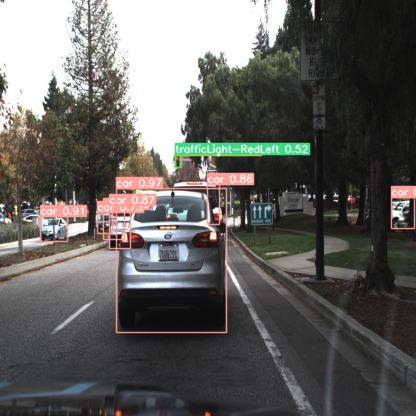

runs/detect/exp10/1478897979538281454_jpg.rf.c1fa6c8fcc9b39f731a979b245cffa83.jpg




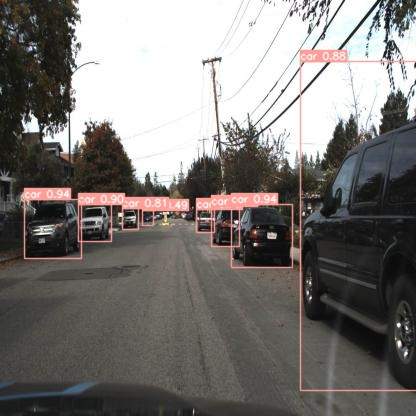

runs/detect/exp10/1478897180876003715_jpg.rf.c66678bacf2ebb590d359a100506eb6b.jpg




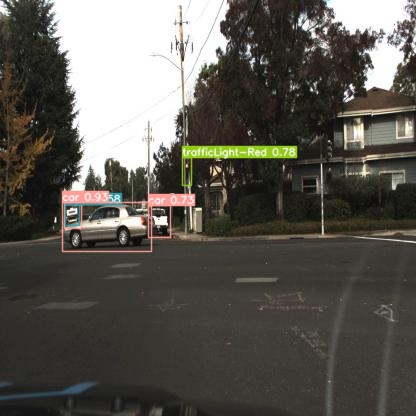

runs/detect/exp10/1478897063189733215_jpg.rf.3876bc08305079358a6fee1573d96c54.jpg




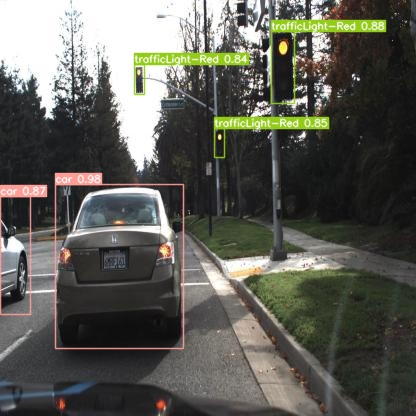

runs/detect/exp10/1478898903884803199_jpg.rf.68b671e6b1570c78b6a508e6f5d2d44c.jpg




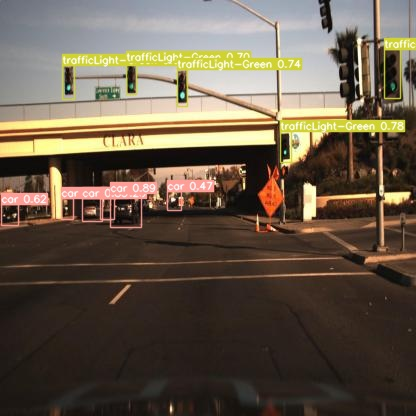

runs/detect/exp10/1478731940733614158_jpg.rf.73c959f4337032238e93218ca03ef2db.jpg




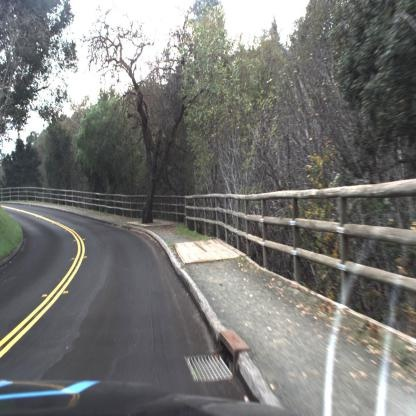

runs/detect/exp10/1478900676026204617_jpg.rf.ca7333e28e2cad4bede4514baf3f7d79.jpg




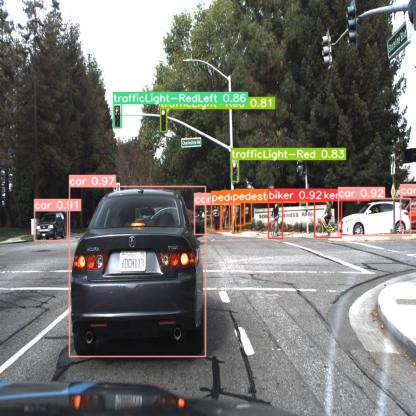

runs/detect/exp10/1478898316599136039_jpg.rf.ed2ba1fc71b6961b01df5403a163e193.jpg




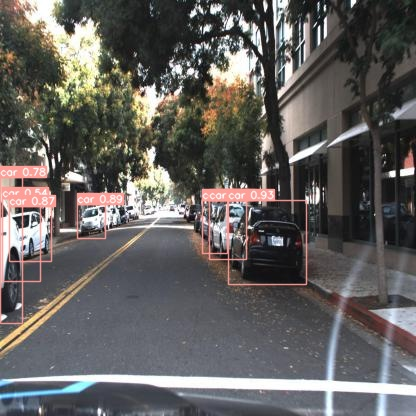

runs/detect/exp10/1478899775673440265_jpg.rf.763136ac08f54655d0eeb687ccb9d6fe.jpg




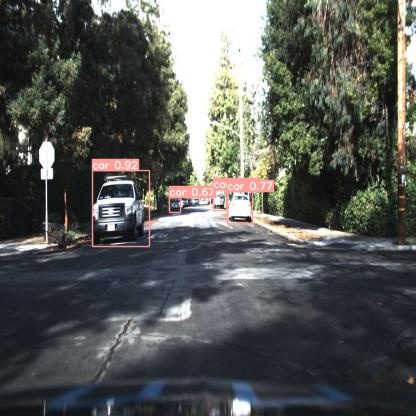

runs/detect/exp10/1478021638574723370_jpg.rf.bc70affd030401db19ec262637d6ac38.jpg




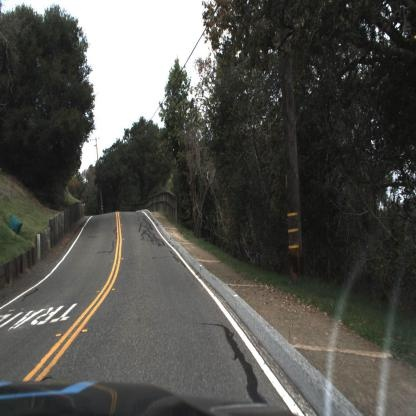

runs/detect/exp10/1478895248202531464_jpg.rf.285540bfb6b9e3ed215aee022fdbeca9.jpg




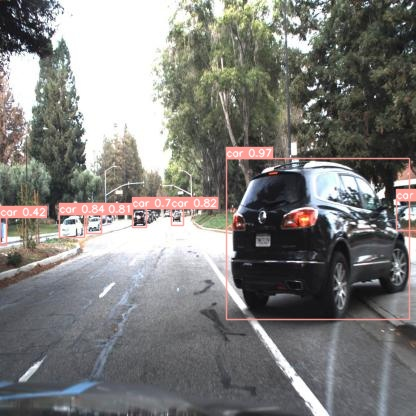

runs/detect/exp10/1478898288034792586_jpg.rf.2792962042cf6c0c885ba382e1121824.jpg




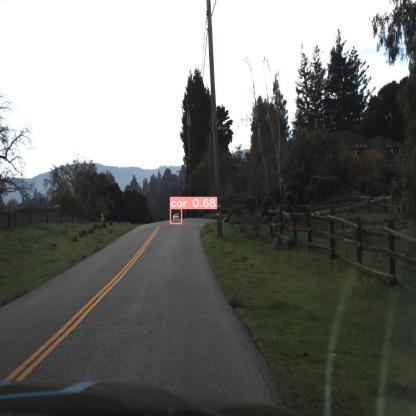

runs/detect/exp10/1478895370457935289_jpg.rf.4805a887d5fcc87eb16e34e7f575457d.jpg




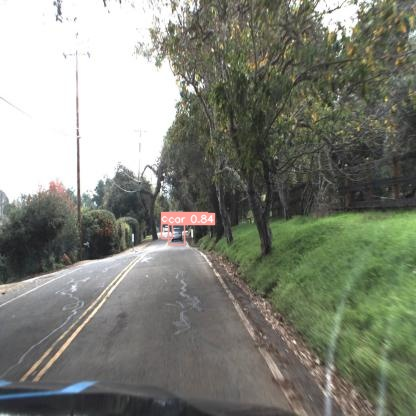

runs/detect/exp10/1478895733799355887_jpg.rf.b9c8aac69e6160294aa1b00343218624.jpg




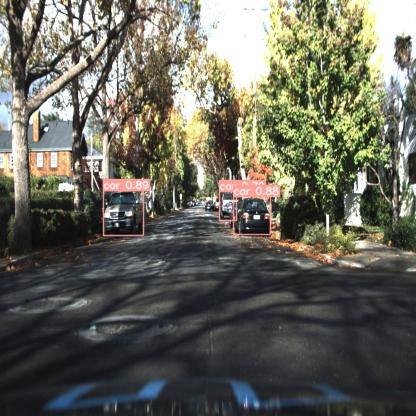

runs/detect/exp10/1478021618577986905_jpg.rf.060f5b0cc2039e3a4b8d0385beeb1154.jpg




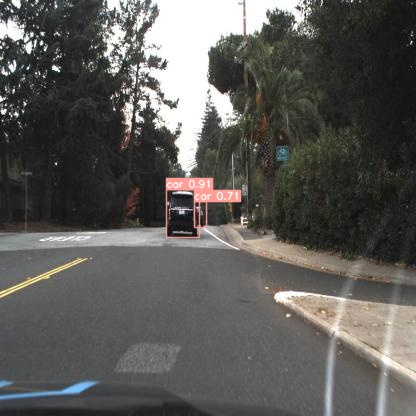

runs/detect/exp10/1478900550342737365_jpg.rf.7f4ba3ca7fd89af4c85e5e25d6d94ba2.jpg




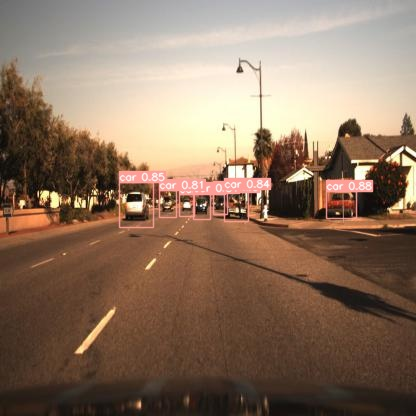

runs/detect/exp10/1478732726405608555_jpg.rf.50cf4a801f666ebaafd12ff4c68822c1.jpg




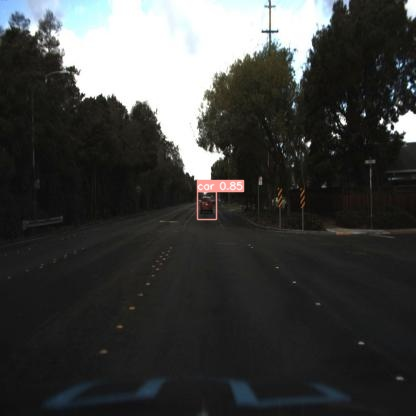

runs/detect/exp10/1478021028722210215_jpg.rf.d3eb0819fc1be595521feb211b48b75a.jpg




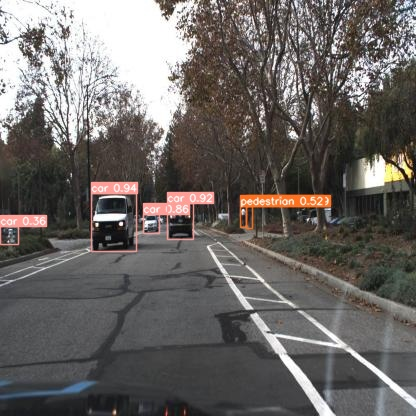

runs/detect/exp10/1478898250901577905_jpg.rf.087582e7dc68b212591ba4e562612c2c.jpg




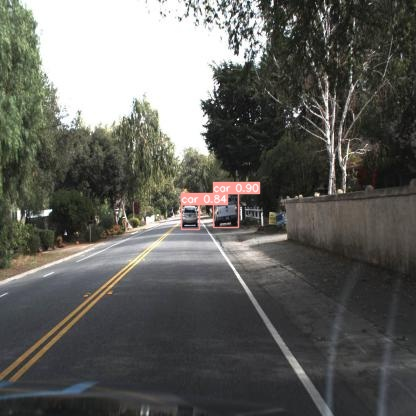

runs/detect/exp10/1478896451909429304_jpg.rf.87233f4e0aed7252edbe88a01f97cea3.jpg




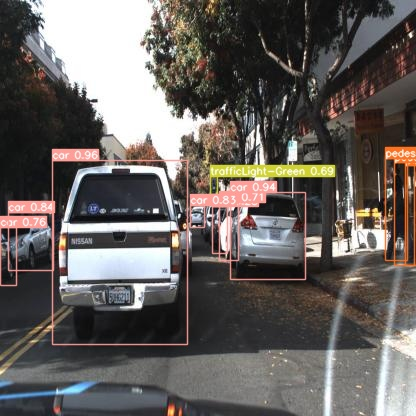

runs/detect/exp10/1478899578578937040_jpg.rf.df450d93192dbef72d72a9b25b9c40e1.jpg




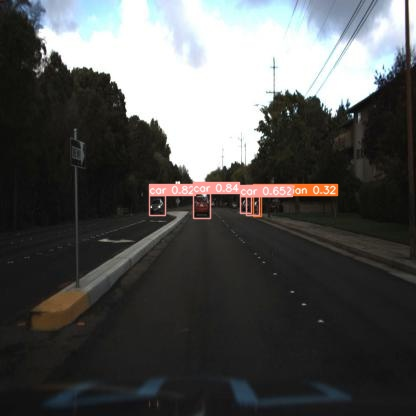

runs/detect/exp10/1478021018721858032_jpg.rf.8109e50eb602700683293cf1b7e555d2.jpg




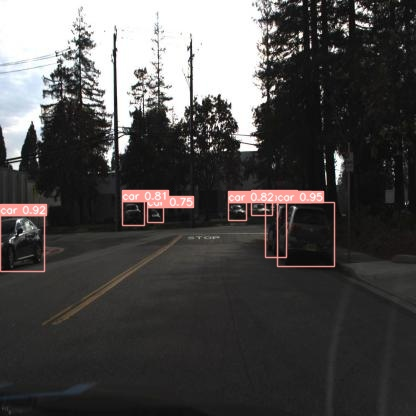

runs/detect/exp10/1478897764161851257_jpg.rf.fd9208e4b399460e4ee7a12dcc7e35b8.jpg




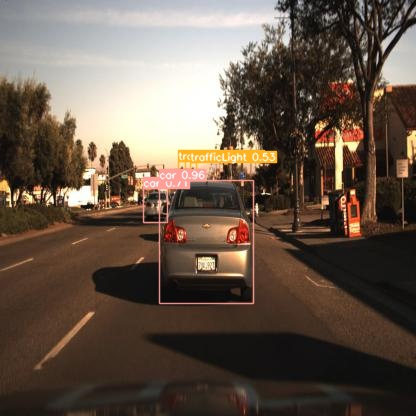

runs/detect/exp10/1478732043960976928_jpg.rf.c3539d3f1486bc1806f794a7987b73ef.jpg




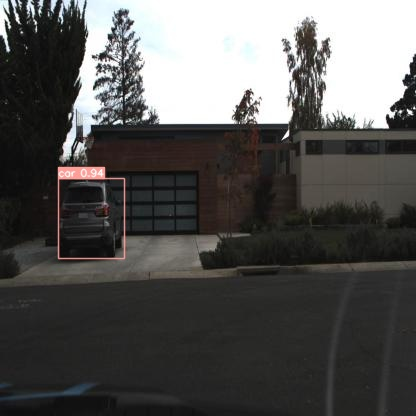

runs/detect/exp10/1478901104494986066_jpg.rf.235ad7b2d9267f7c0d7a58a9c477e38f.jpg




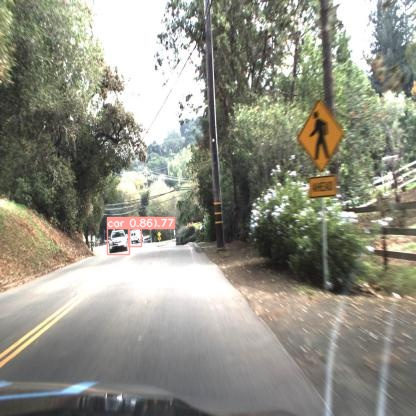

runs/detect/exp10/1478896196543299522_jpg.rf.af6f2489a178a19277baf77757d1df27.jpg




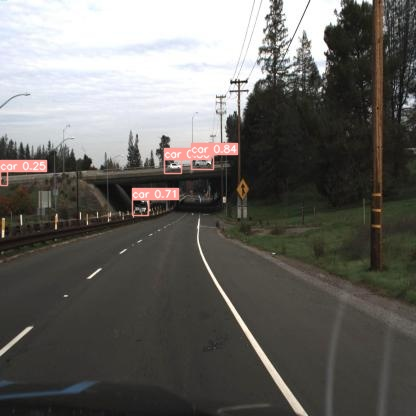

runs/detect/exp10/1478896282807728065_jpg.rf.d18d219a4411ceff18c1fb1ec0c70632.jpg




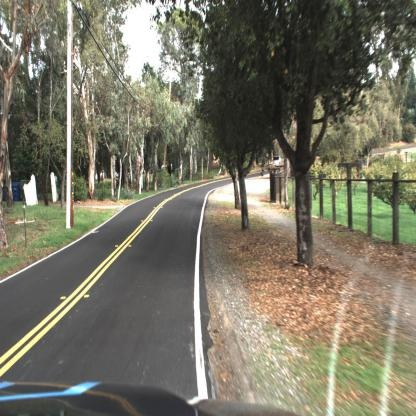

runs/detect/exp10/1478896006875036247_jpg.rf.00d9306a45452af94b3f70db1d30c473.jpg




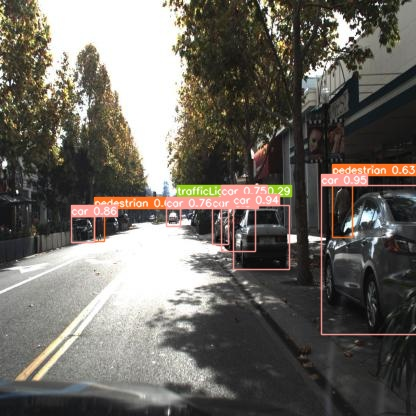

runs/detect/exp10/1478899819091237334_jpg.rf.295fa2f374497370a342a2e73d1103b8.jpg




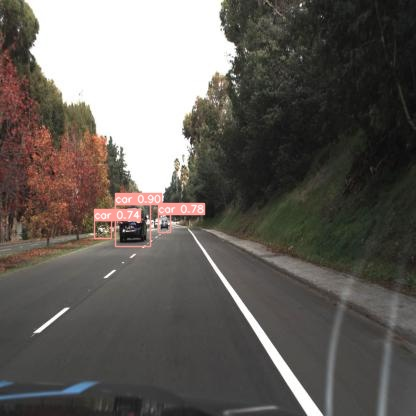

runs/detect/exp10/1478896311373552930_jpg.rf.1853da00e3f59798c54ddc0f3c8d62f5.jpg




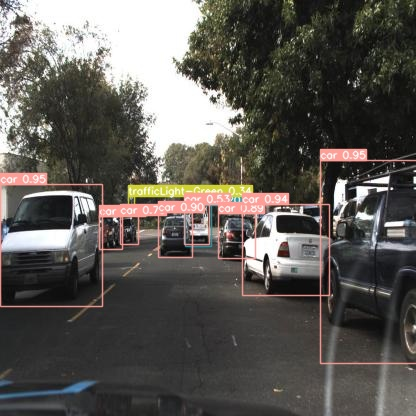

runs/detect/exp10/1478897405963679249_jpg.rf.623fdaa437a58bb89c91fd2f01c1e7b2.jpg




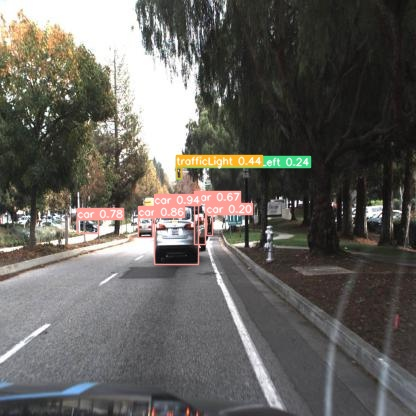

runs/detect/exp10/1478897968684106933_jpg.rf.98a61c64fa6c7f8cbc3c7fcc3d59a659.jpg




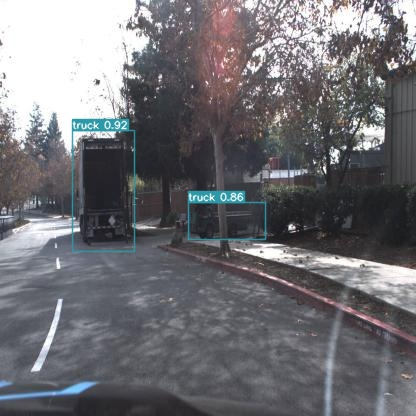

runs/detect/exp10/1478898741638800829_jpg.rf.29258fc964b4274d2b43601e87920704.jpg




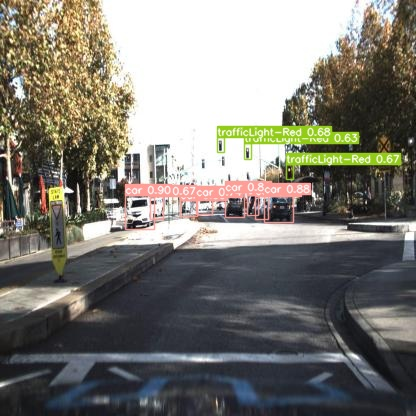

runs/detect/exp10/1478020416199395584_jpg.rf.7607e82291d7c2ca6f256dfb99ad5316.jpg




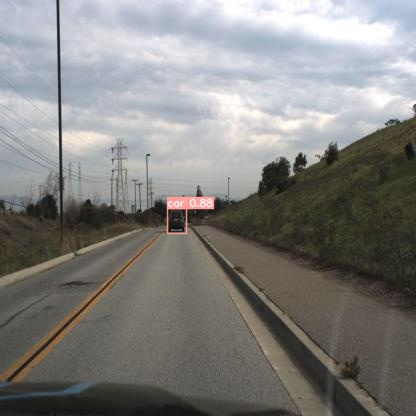

runs/detect/exp10/1478898464563723079_jpg.rf.d8fb618c1aab9503e8b6f865c75ab394.jpg




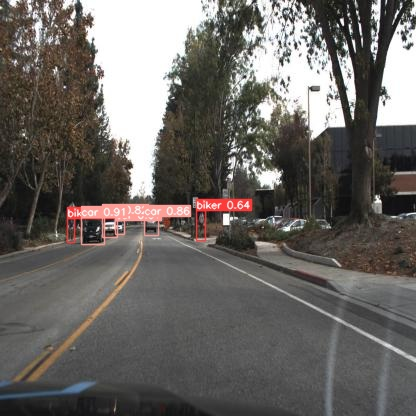

runs/detect/exp10/1478898114933820764_jpg.rf.1035f7be7b781a05b7eed1e73faeb9df.jpg




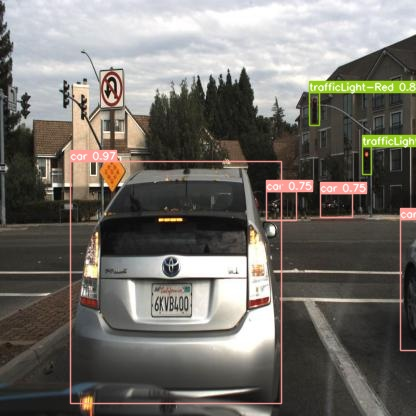

runs/detect/exp10/1478896688423612224_jpg.rf.617e40b19d281d82ad98740836a7049b.jpg




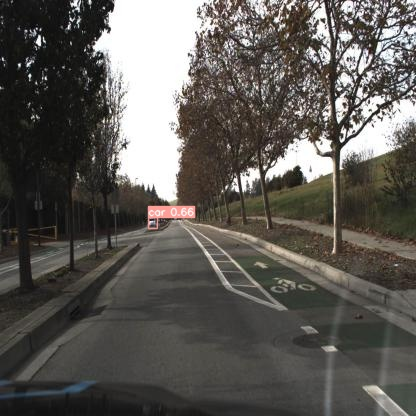

runs/detect/exp10/1478898654804792098_jpg.rf.da02a0aafc4b08430bc29e23456ca235.jpg




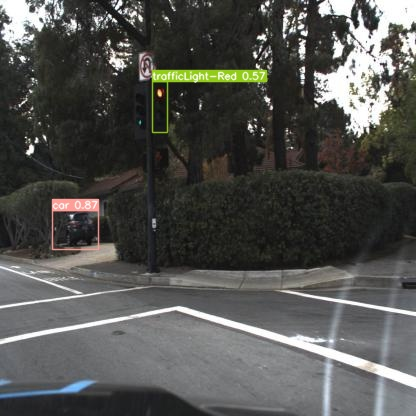

runs/detect/exp10/1478900350962076388_jpg.rf.b9c41db201879b38637b5f3820cf89a8.jpg




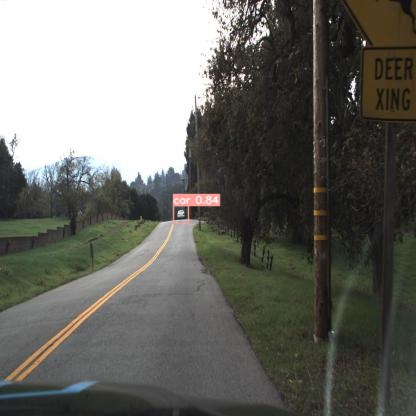

runs/detect/exp10/1478895367601623377_jpg.rf.c3ceeb95ed835e8575d7d0f9f7b9d41d.jpg




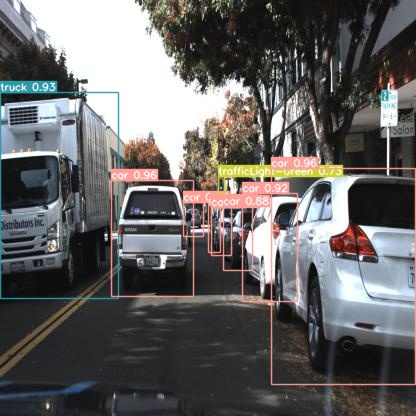

runs/detect/exp10/1478899588290245043_jpg.rf.a7bc08893cb1c38709e4caaee8230e23.jpg




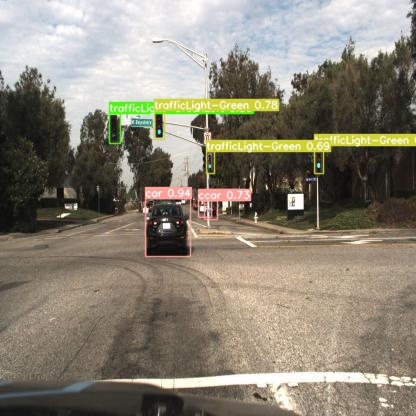

runs/detect/exp10/1478897617340583993_jpg.rf.87219bbf3a69c51b84072a789ee0180e.jpg




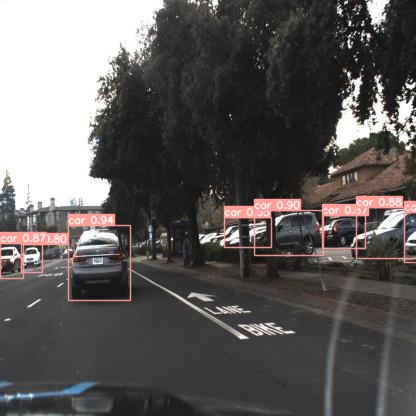

runs/detect/exp10/1478901415275033759_jpg.rf.a373c44fdf94a2699afefd487b9ee995.jpg




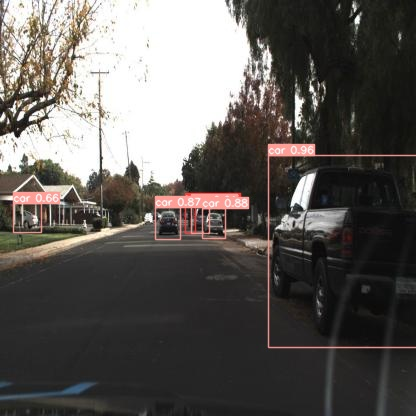

runs/detect/exp10/1478896983781251920_jpg.rf.eb06247f0ecd2ab93889fed9cba6b081.jpg




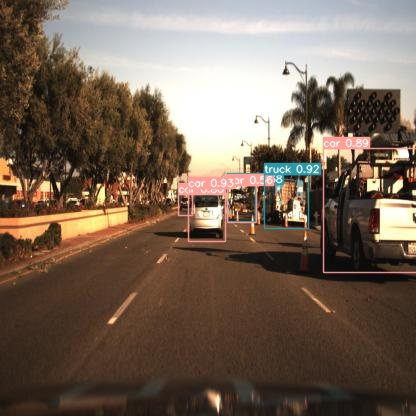

runs/detect/exp10/1478731977436292831_jpg.rf.fa72ce8d2d16e5aaba1874c2a95c10bb.jpg




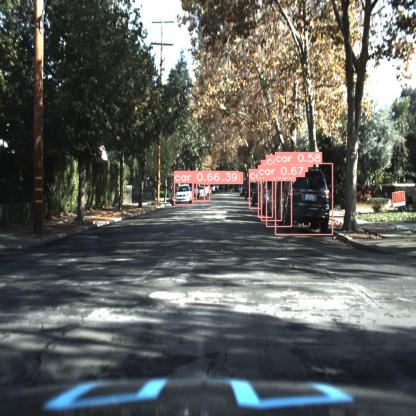

runs/detect/exp10/1478021597074545257_jpg.rf.c5797dd128316f108f43f72a4e42c5bb.jpg




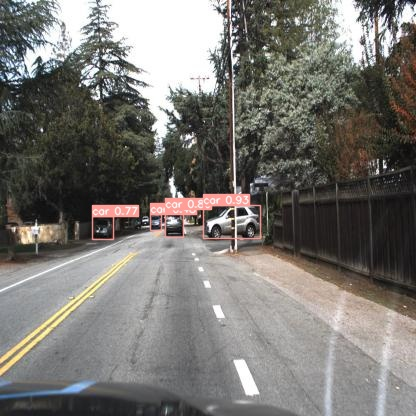

runs/detect/exp10/1478896572451662836_jpg.rf.f76ab340fdde66e70ca08b097847f923.jpg




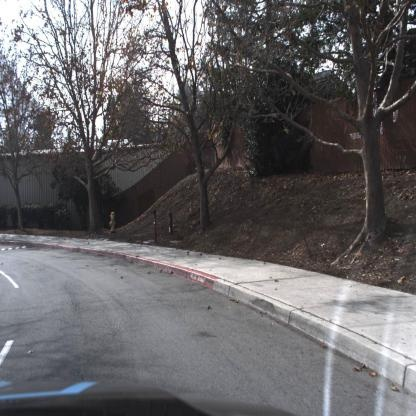

runs/detect/exp10/1478898737640579622_jpg.rf.07c280d1fac359ac4c626c6ea39866d4.jpg




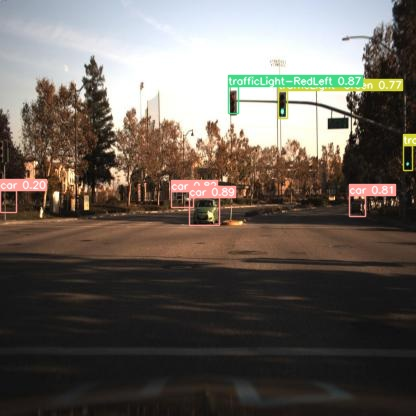

runs/detect/exp10/1478732850851690173_jpg.rf.a31baa23c937ebb8fef3ce31bb9cfb3b.jpg




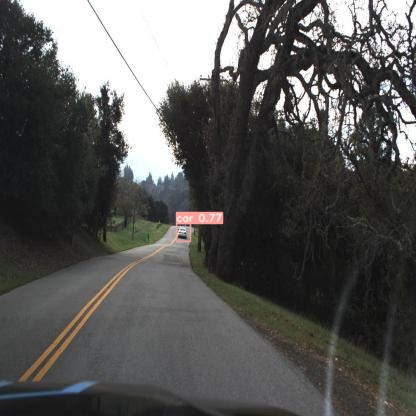

runs/detect/exp10/1478895363603417303_jpg.rf.5ad35fc8d884558b06b98ed7051f279c.jpg




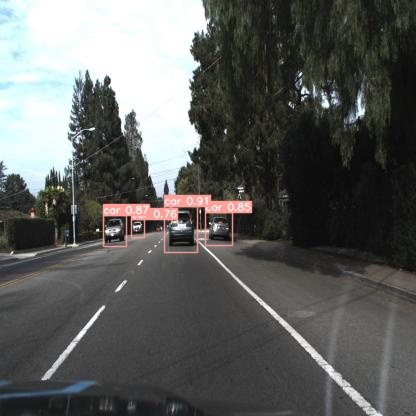

runs/detect/exp10/1478896608443676024_jpg.rf.e786df453269e3e0f2afdc8fcbd4822c.jpg




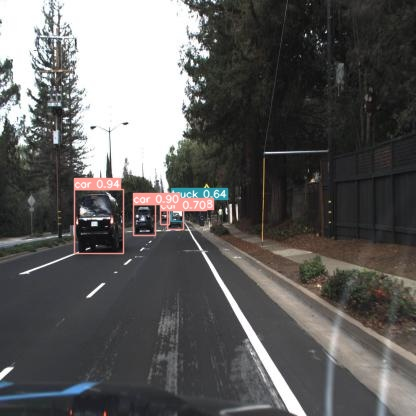

runs/detect/exp10/1478901016516245360_jpg.rf.d9131b40967f9d5f2109c58fab46f260.jpg




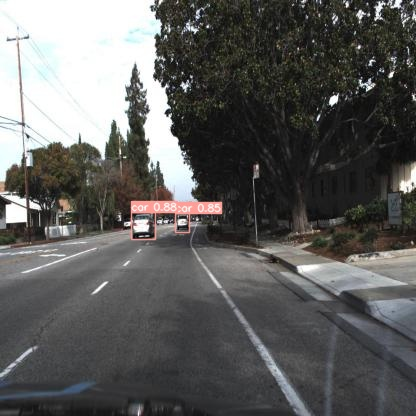

runs/detect/exp10/1478896877520682897_jpg.rf.faf8a1b35dd768e186425c318348309d.jpg




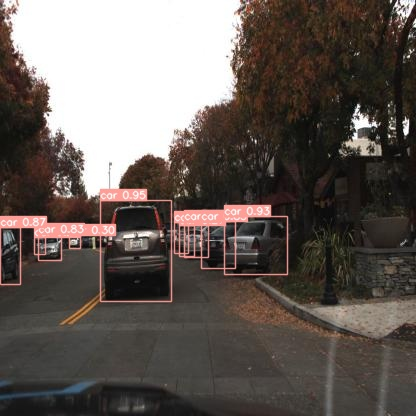

runs/detect/exp10/1478900887403737871_jpg.rf.306f25d1202a7b758c96e976586904de.jpg




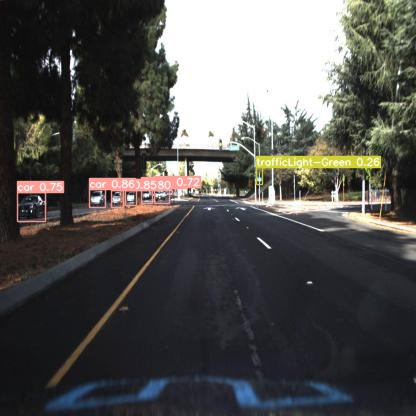

runs/detect/exp10/1478020528700390619_jpg.rf.a4d8a31b884350b19d1b4384e473363f.jpg




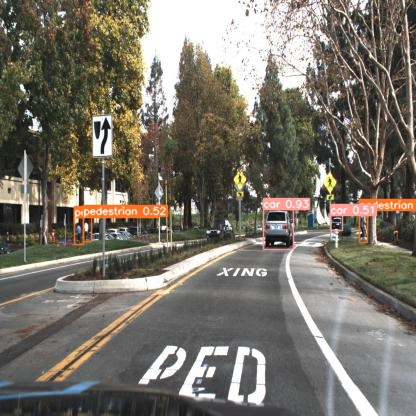

runs/detect/exp10/1478897785299722105_jpg.rf.8b5b24c9f88a60117a763fa54310e612.jpg




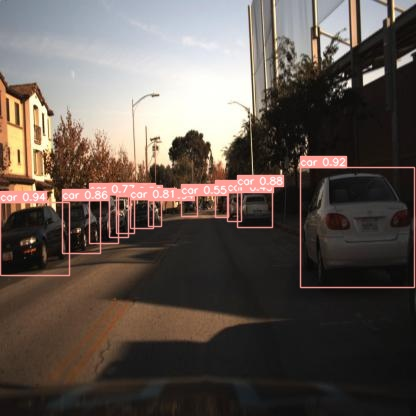

runs/detect/exp10/1478732941462829337_jpg.rf.13ee8683be0b767e2c7fc75811635427.jpg




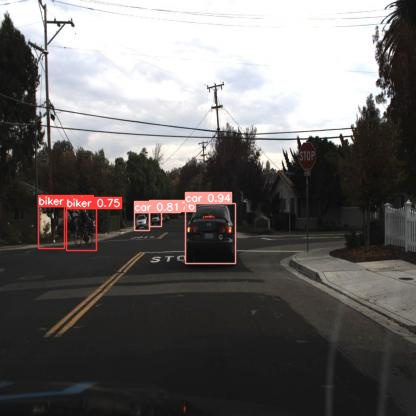

runs/detect/exp10/1478896999205403273_jpg.rf.d49932611a22d4206f44d6945949d301.jpg




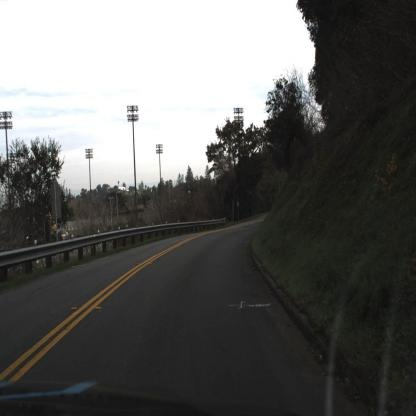

runs/detect/exp10/1478896251387975269_jpg.rf.db14e58ef07cae230796ee9b2d89a4d4.jpg




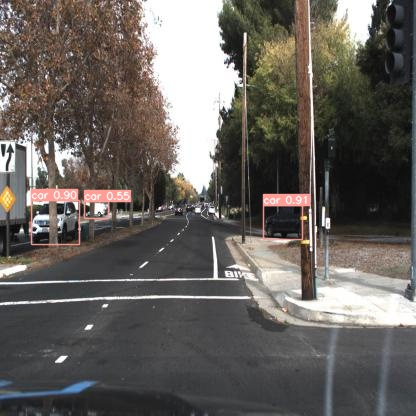

runs/detect/exp10/1478896913512514927_jpg.rf.56827f1c88aa1e3779c59d75a6a92581.jpg




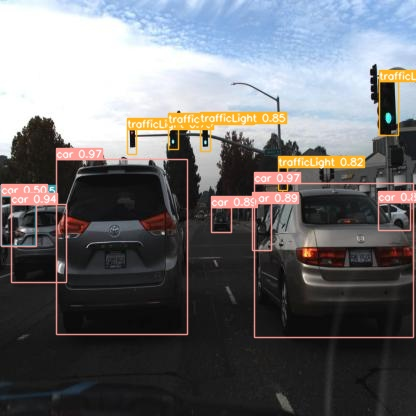

runs/detect/exp10/1478901361003850355_jpg.rf.fc7835bbff84309b6bec6cc2ee20186a.jpg




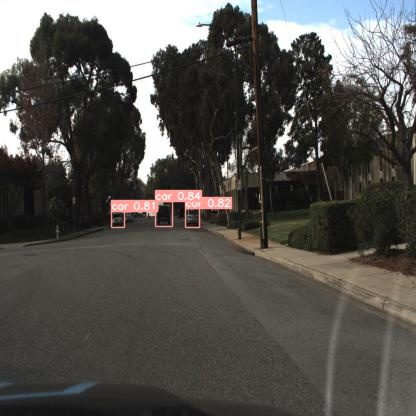

runs/detect/exp10/1478897725887349028_jpg.rf.b3ea6d8c71e3a8cc89b462fb613fe116.jpg




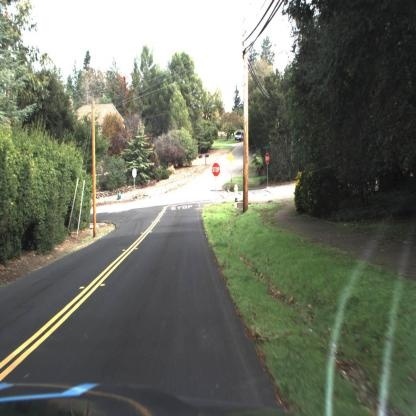

runs/detect/exp10/1478895605259437011_jpg.rf.9fcc49fab12d0b9dda3c223241b36009.jpg




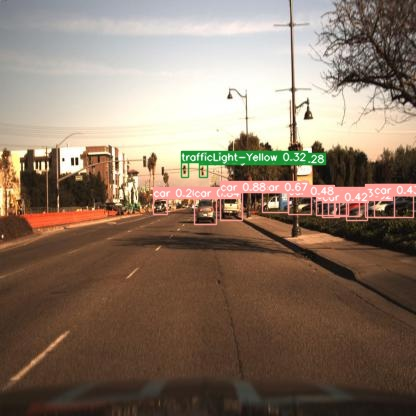

runs/detect/exp10/1478732085825466179_jpg.rf.382176bfa64729c446069e984fe9a1db.jpg




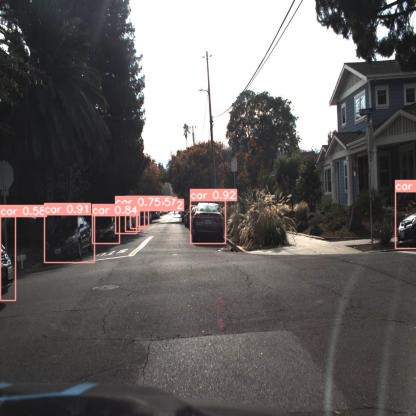

runs/detect/exp10/1478899724830373627_jpg.rf.aad9bdeb0d11251b6a25d84fc694143a.jpg




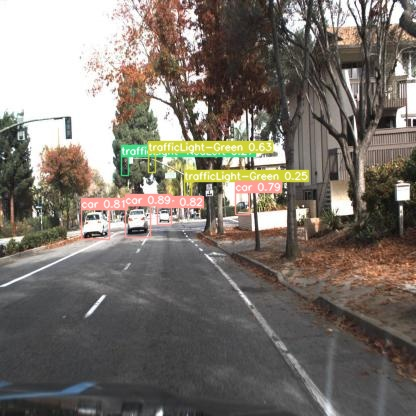

runs/detect/exp10/1478896867236693815_jpg.rf.26e2691c655cb12002df78ace13df115.jpg




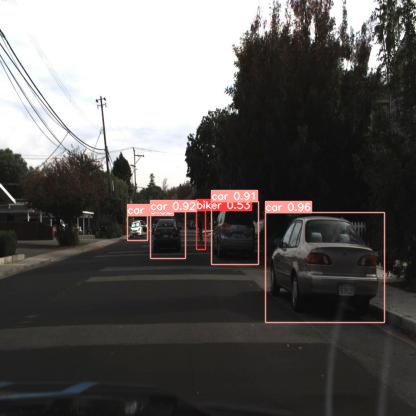

runs/detect/exp10/1478896987207616403_jpg.rf.f8bfafd95394610325e3b185e0964647.jpg




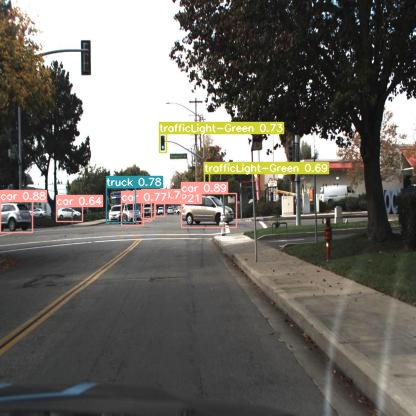

runs/detect/exp10/1478897226007911437_jpg.rf.1e465a962903f61203642e51f5e163f8.jpg




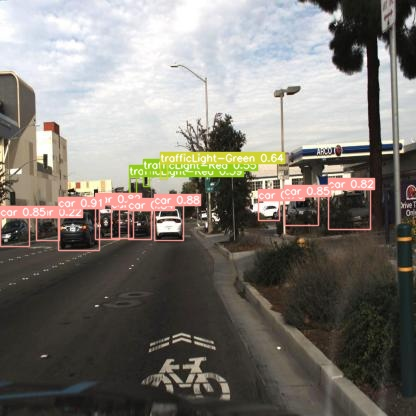

runs/detect/exp10/1478897477374646490_jpg.rf.6447591a8d35c40a1450c8c9a4c33b93.jpg




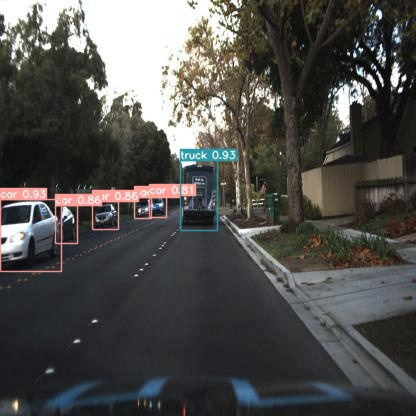

runs/detect/exp10/1478021140221546401_jpg.rf.86457604ad1c0014038b2b5135df705d.jpg




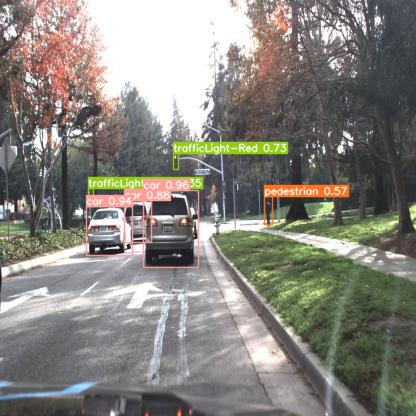

runs/detect/exp10/1478898937021409351_jpg.rf.d4b8400c4c5dae0dca5a7ad9c2a92eaf.jpg




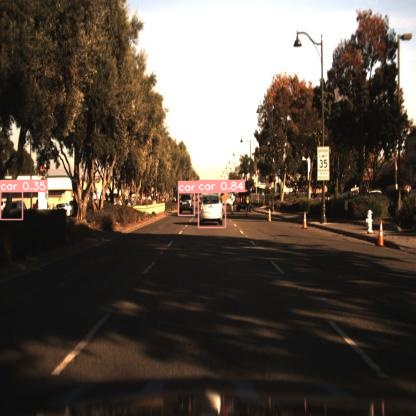

runs/detect/exp10/1478731968834315281_jpg.rf.80e37dc1c95f38cd34c74c70270fc827.jpg




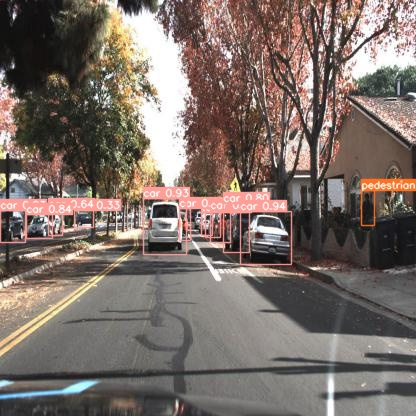

runs/detect/exp10/1478899260370753670_jpg.rf.c014c54230a4ac68419fad0089a6e0bc.jpg




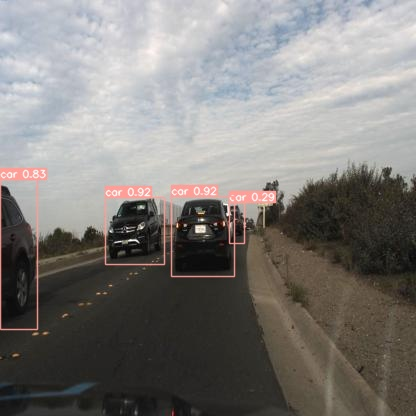

runs/detect/exp10/1478897543074037061_jpg.rf.d68c56c9f240ace9798791f0089b7a87.jpg




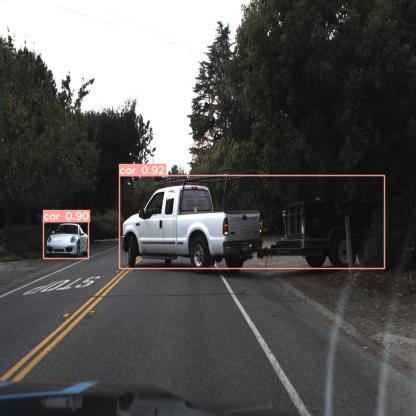

runs/detect/exp10/1478900275552350212_jpg.rf.e1597757e4fbcdb70e1dac444f018eed.jpg




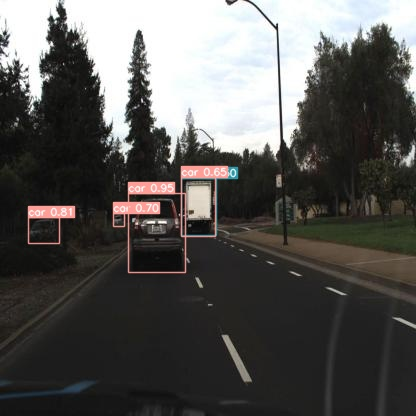

runs/detect/exp10/1478900965669862660_jpg.rf.63b1aebb343554540f13b084aeeb069f.jpg




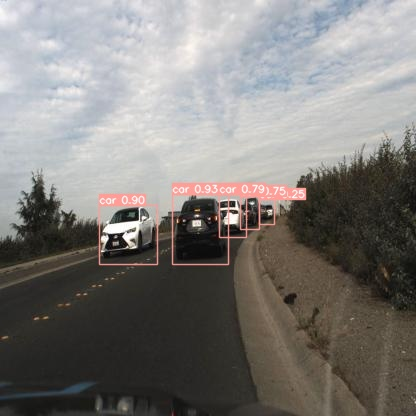

runs/detect/exp10/1478897541358847082_jpg.rf.caecdbbb3e4fa48987a174d2f70b6e34.jpg




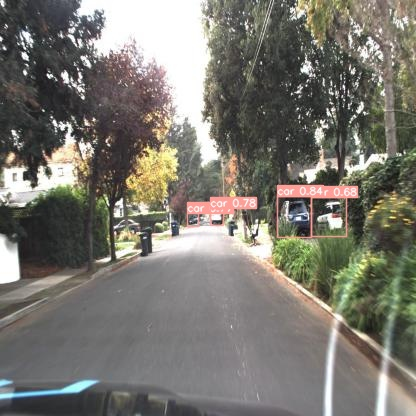

runs/detect/exp10/1478901447268027532_jpg.rf.e7143d2761d7656cbc52bbf72b17cb76.jpg




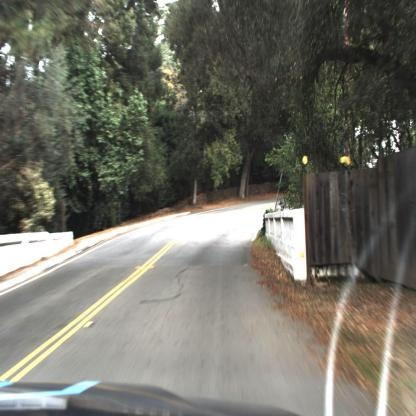

runs/detect/exp10/1478900787428404318_jpg.rf.475c2236ed4093430418049557bfb673.jpg




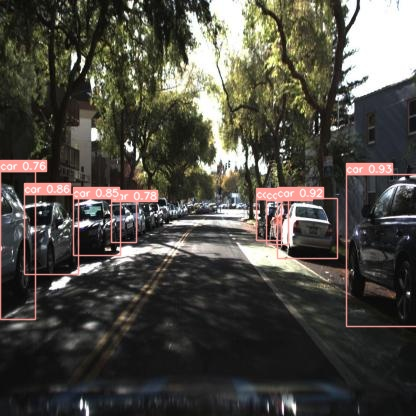

runs/detect/exp10/1478021926585144697_jpg.rf.691282cb2a9887d6c764129a16a32037.jpg




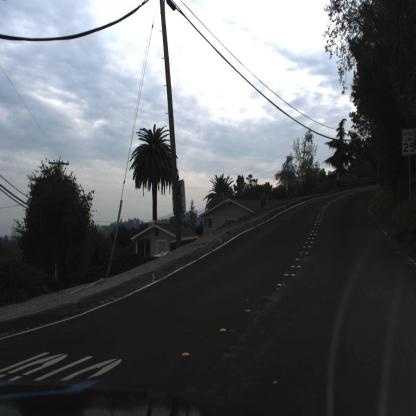

runs/detect/exp10/1478895835488849582_jpg.rf.0c89cefdd5afaeccc9883c38cf024f10.jpg




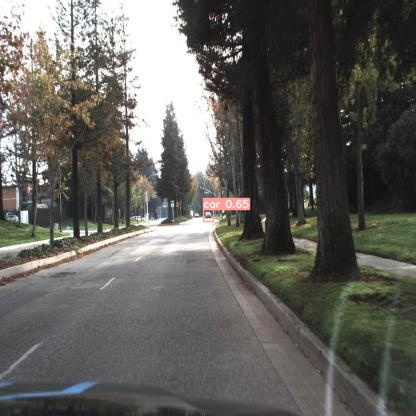

runs/detect/exp10/1478898884461231532_jpg.rf.d681e553e44d40009ea74e3295dd0bad.jpg




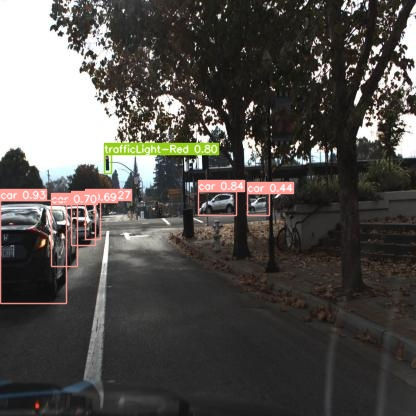

runs/detect/exp10/1478899968197924653_jpg.rf.145a30e1dc27f679f0f6dd79f1735521.jpg




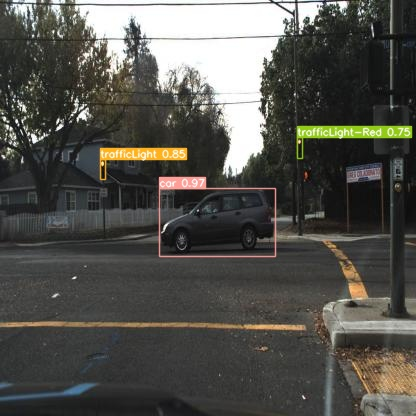

runs/detect/exp10/1478900055033646275_jpg.rf.50313a8b2cbbfb600676b34a0170f948.jpg




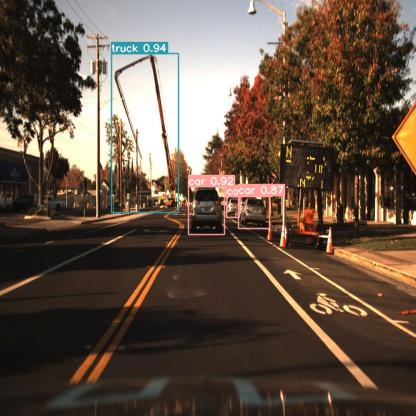

runs/detect/exp10/1478732635222962759_jpg.rf.f4ac1b784466e7ae6f74790ec562ec43.jpg




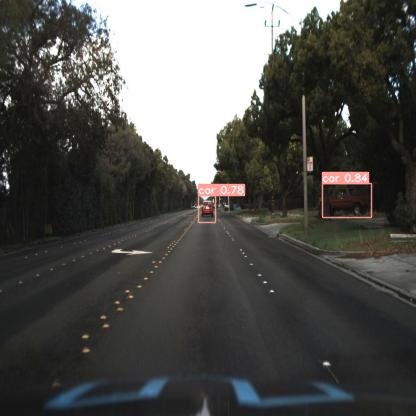

runs/detect/exp10/1478021033223296820_jpg.rf.6362748e71f5cdac2e60c463e7dfbc06.jpg




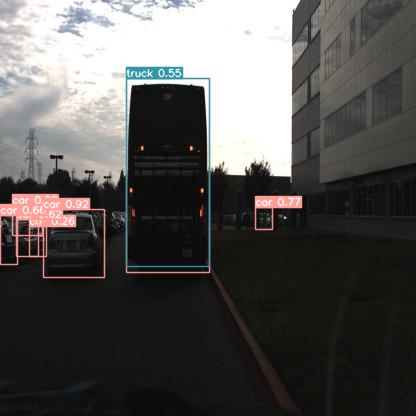

runs/detect/exp10/1478898582249342946_jpg.rf.ff58b86796dae2d9506b73ae543bf61e.jpg




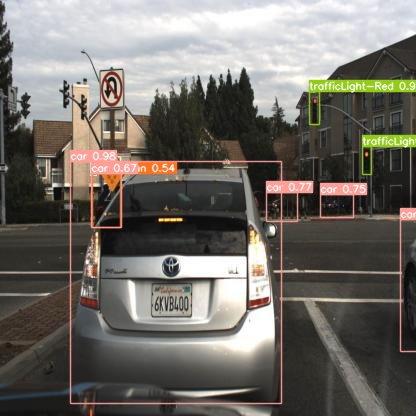

runs/detect/exp10/1478896707847375404_jpg.rf.3dbf262bd4b79f4e88d6fda91f62b438.jpg




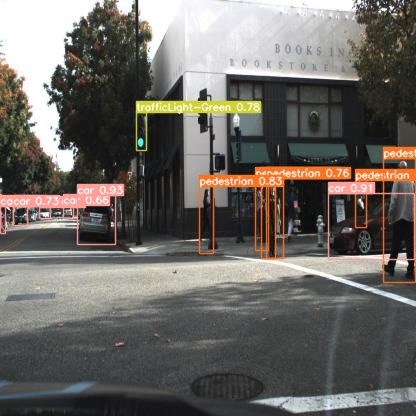

runs/detect/exp10/1478899807665728443_jpg.rf.1c33182d6427b77d0b7f39475fd11004.jpg




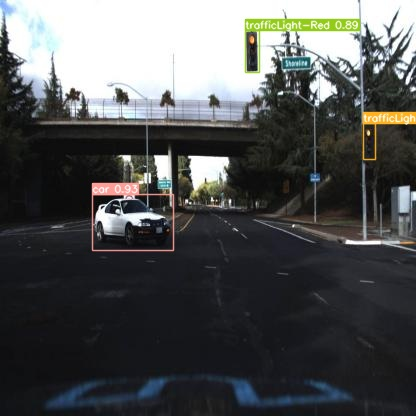

runs/detect/exp10/1478020537707923671_jpg.rf.139c3f6add7648b7d738681aa0dac9be.jpg




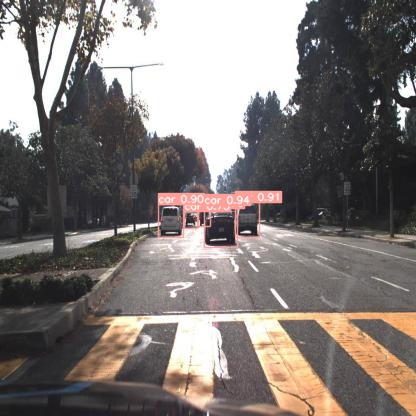

runs/detect/exp10/1478899222093805011_jpg.rf.2c4c44dda5bef3d232b3b59dd6837354.jpg




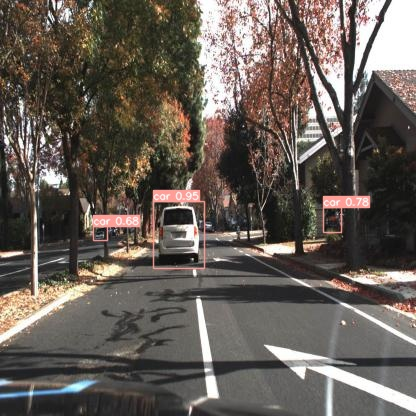

runs/detect/exp10/1478899252372483190_jpg.rf.8035d5795b538583ebb2960884192470.jpg




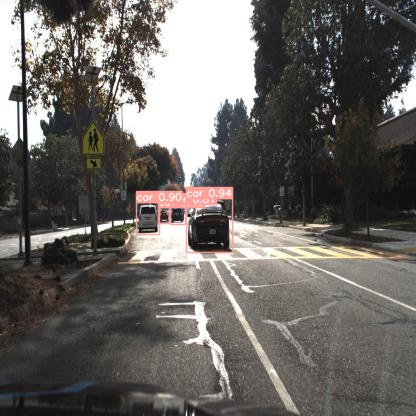

runs/detect/exp10/1478899220952792987_jpg.rf.f02c53e9416acf747051b4dab9438341.jpg




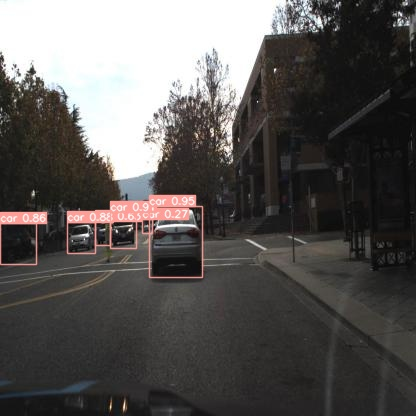

runs/detect/exp10/1478899934492176935_jpg.rf.3b6222c2f2decb0fc5b59f08b9e5b646.jpg




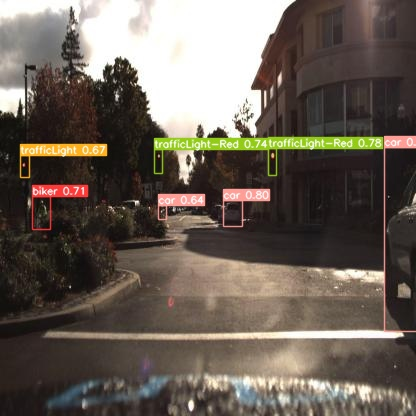

runs/detect/exp10/1478020297691704932_jpg.rf.a04aa3e61e2339f22a78ccd34275e0e2.jpg




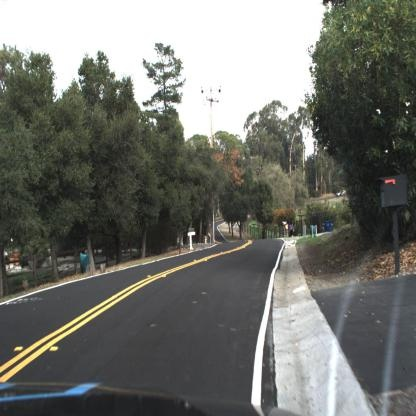

runs/detect/exp10/1478896000590858940_jpg.rf.7f43baab2cab1e4e869aff6dc1a7b9c7.jpg




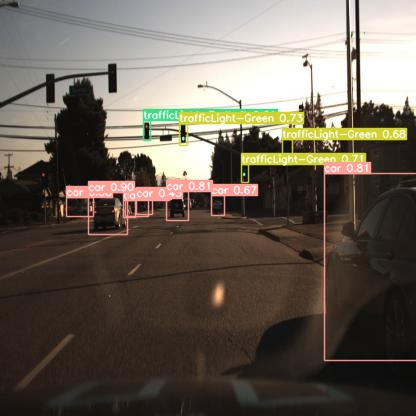

runs/detect/exp10/1478732359377563290_jpg.rf.3af1c1338fa959b9d95603de0cabc3f4.jpg




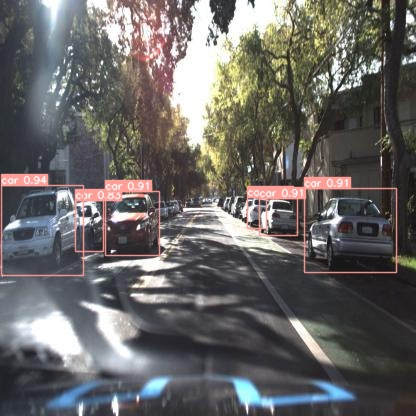

runs/detect/exp10/1478021912090247953_jpg.rf.06be105d482ebba7e9e312c918266059.jpg




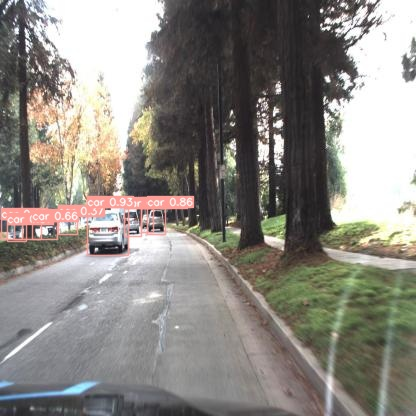

runs/detect/exp10/1478898968441157747_jpg.rf.05cb63c9e0fb6e96a7d9dfbfd7cf3c50.jpg




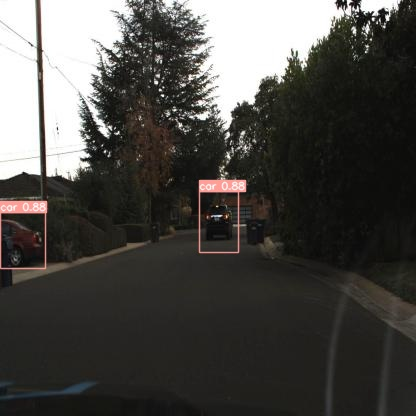

runs/detect/exp10/1478901094781078457_jpg.rf.33ef8c58f829561fa936d18d7860a09b.jpg




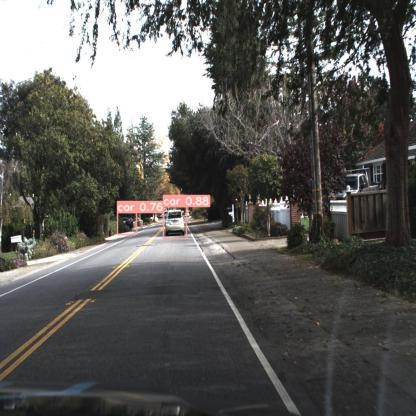

runs/detect/exp10/1478896459336991727_jpg.rf.f1b6dce4afde85768bb748e518060a11.jpg




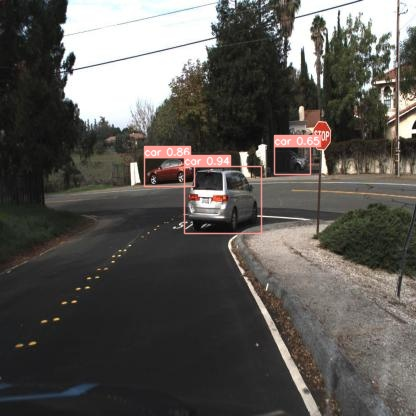

runs/detect/exp10/1478896067431536894_jpg.rf.65b41e3661d63a6d2da54095cefdc4ab.jpg




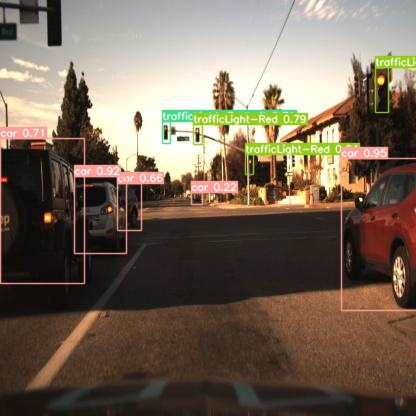

runs/detect/exp10/1478732702893512106_jpg.rf.e1814a5b64efa87cdf105ec9763a3dae.jpg




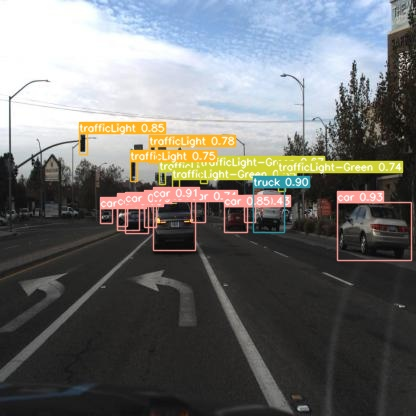

runs/detect/exp10/1478901396422368025_jpg.rf.166214739d5dc45f716b1ac9d50e699c.jpg




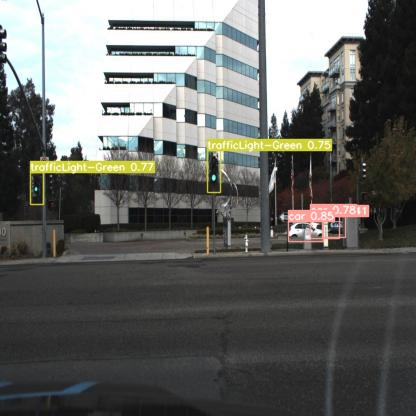

runs/detect/exp10/1478901288448454717_jpg.rf.f12d5f1b7c8b1ceccab0f0411d403bfa.jpg




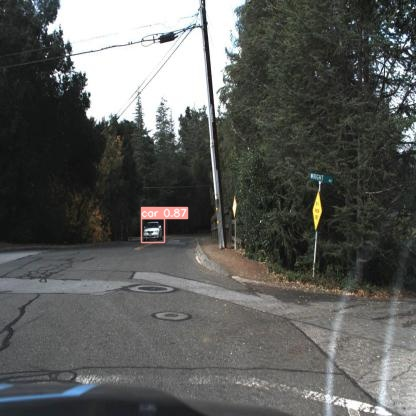

runs/detect/exp10/1478895333895629397_jpg.rf.92bef44570739f6f55495192c6b5e36b.jpg




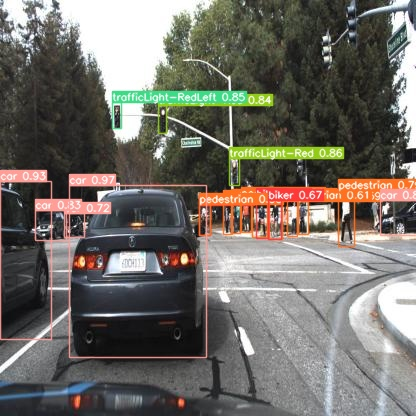

runs/detect/exp10/1478898356590043065_jpg.rf.e135e0251eb3f647b265303dad8f2e7e.jpg




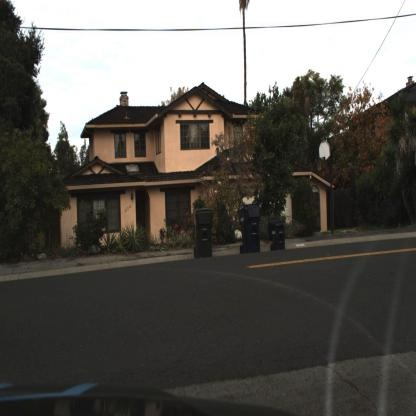

runs/detect/exp10/1478901088497577608_jpg.rf.ff3cb0522e2b5adfac0fb9068bcc328f.jpg




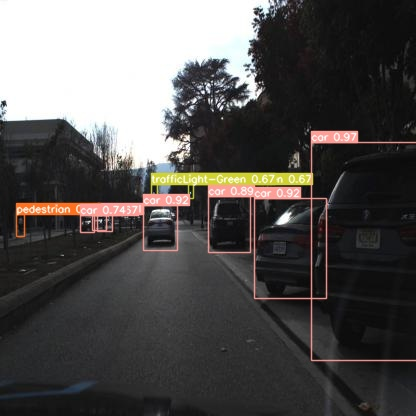

runs/detect/exp10/1478899864794432745_jpg.rf.0f2fe7a9c0dc7e448bae3c67fb3dcc17.jpg




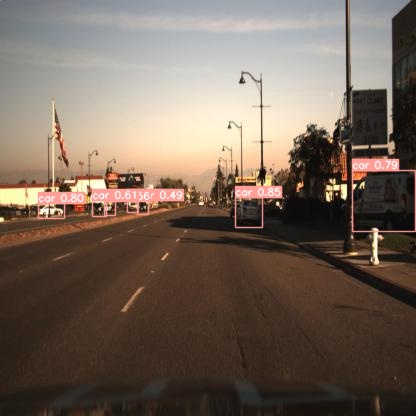

runs/detect/exp10/1478732020449501581_jpg.rf.dba05da7e064988cd5c73458b5c62da1.jpg




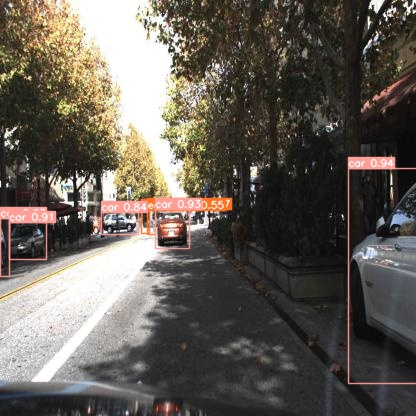

runs/detect/exp10/1478899449466668225_jpg.rf.5a504bc003cf1e9e1df5d069f56def63.jpg




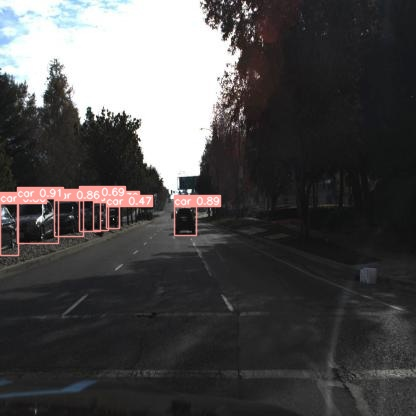

runs/detect/exp10/1478899042137176497_jpg.rf.1d7463324552cfc4eb9ea51d7f593291.jpg




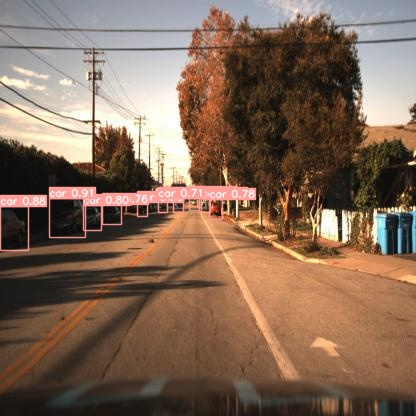

runs/detect/exp10/1478732570992825389_jpg.rf.de577ed096fecf1d9b5380e6e4b45c1d.jpg




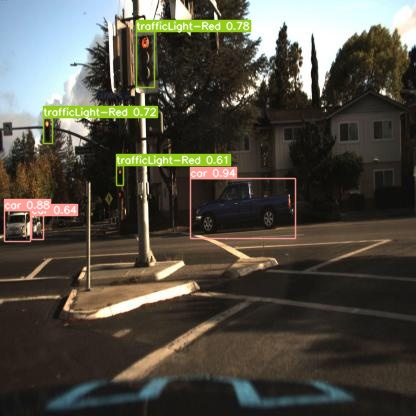

runs/detect/exp10/1478019978180101986_jpg.rf.ad4cb4af9b020d30576ad94426efff7c.jpg




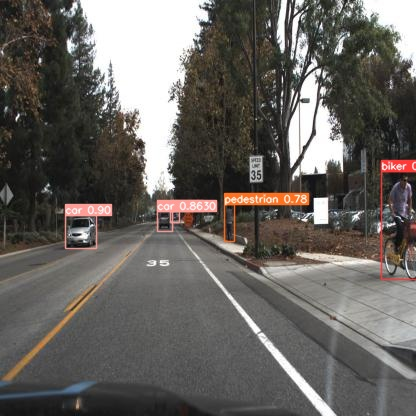

runs/detect/exp10/1478898117219676049_jpg.rf.dc4309b217b93bf3c1a375444d6a88e2.jpg




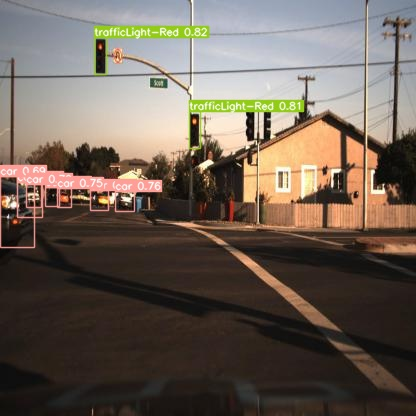

runs/detect/exp10/1478732324393864792_jpg.rf.7c68723cc69c8193504aa2a3acd83a9c.jpg




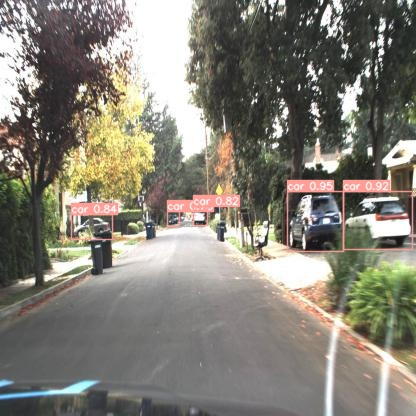

runs/detect/exp10/1478901448409635186_jpg.rf.66d9e3b75176ae95832a71fda0e5c607.jpg




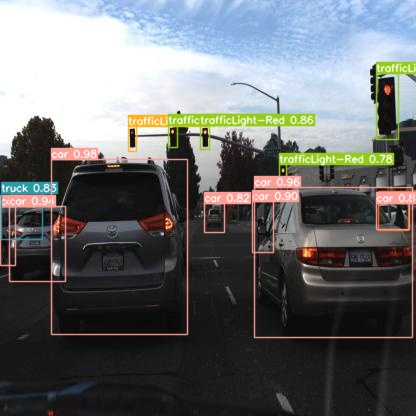

runs/detect/exp10/1478901355289827542_jpg.rf.8857823c78d957a6dc7a2f67af177760.jpg




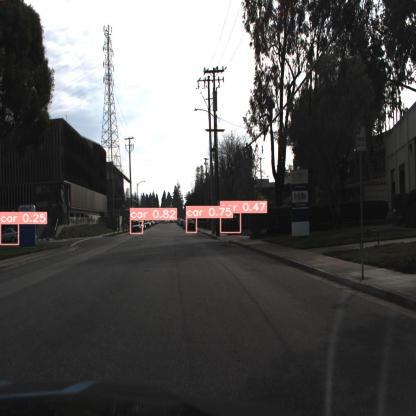

runs/detect/exp10/1478897739596898831_jpg.rf.53017d91ae223c3ee9d43b62d01d6dd7.jpg




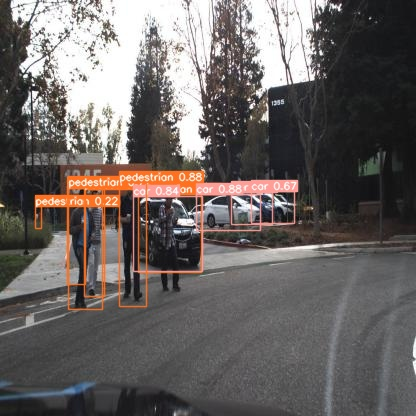

runs/detect/exp10/1478898185775688848_jpg.rf.53c4578e9f86ab2dfa943b216c3f5e50.jpg




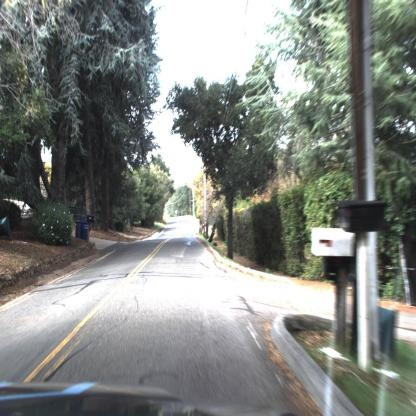

runs/detect/exp10/1478895318472432509_jpg.rf.02a856d790fed61a38640899f0ef26b9.jpg




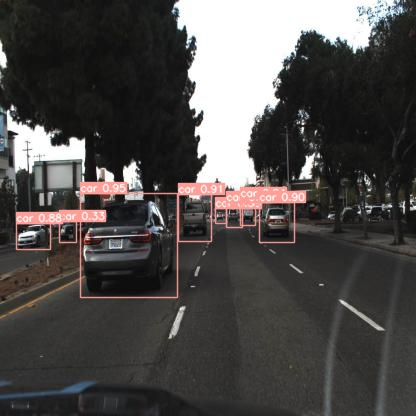

runs/detect/exp10/1478901380426389729_jpg.rf.2aad60ff611366cefa5e12b54aceb79c.jpg




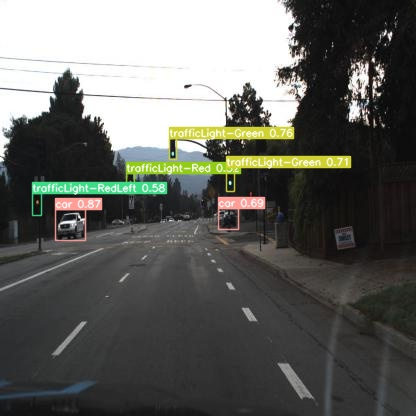

runs/detect/exp10/1478900374956660325_jpg.rf.730ce472009ab369bd47a78c1dc20b9b.jpg




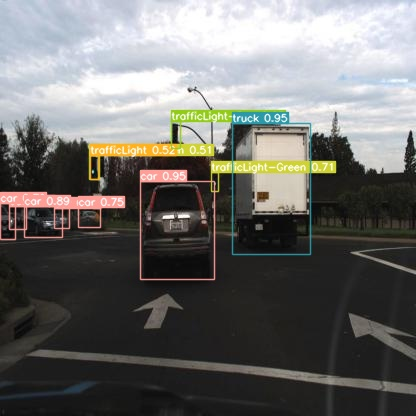

runs/detect/exp10/1478900958243780665_jpg.rf.abaccd6d40501f474fa5caf2947d5c25.jpg




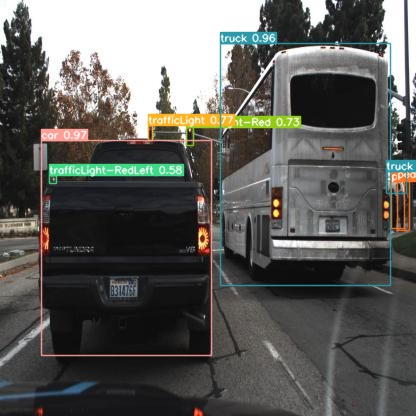

runs/detect/exp10/1478898088656180423_jpg.rf.d08b5bf250807242098be99b5090fb9e.jpg




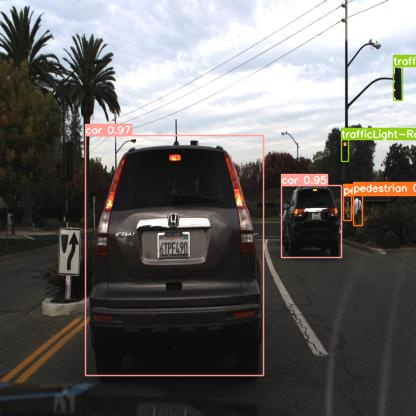

runs/detect/exp10/1478900927965376747_jpg.rf.19cc3568a9145241ec1fcb1c0c0bea67.jpg




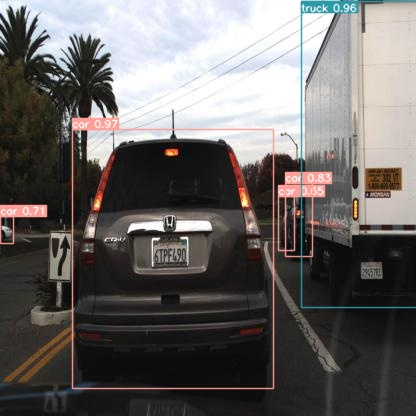

runs/detect/exp10/1478900937105306299_jpg.rf.3ec11588b09ee1f6762653cc28d2af02.jpg




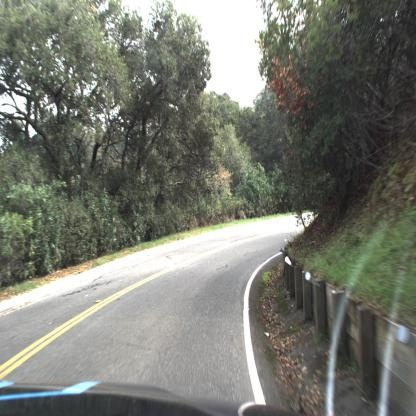

runs/detect/exp10/1478895760078920412_jpg.rf.998b26e2ba2c2cd06977ee3c2e9f63ce.jpg




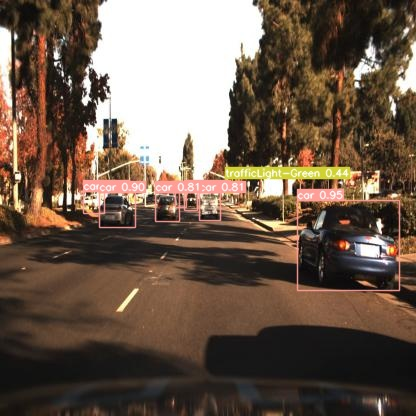

runs/detect/exp10/1478731892561100747_jpg.rf.c9918070d1cd95b7424263aabb6c7c85.jpg




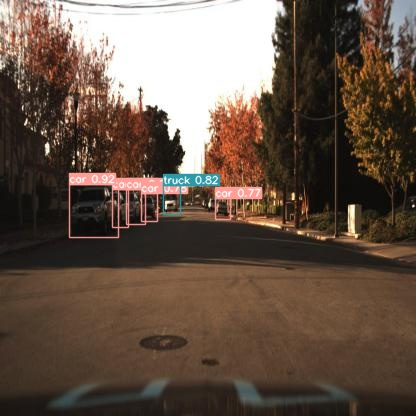

runs/detect/exp10/1478733020603231956_jpg.rf.960e4bb760d72da808722981c2bd096b.jpg




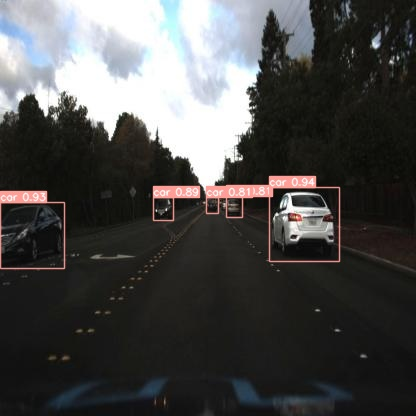

runs/detect/exp10/1478020938719618403_jpg.rf.579fb7c5f697552af570887a1fcf4b05.jpg




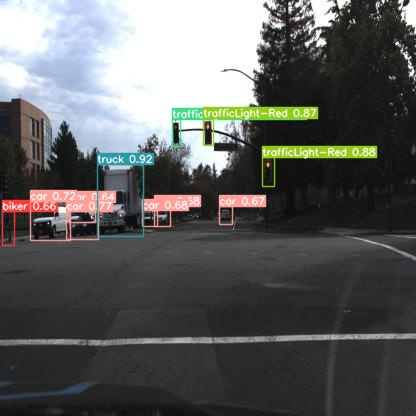

runs/detect/exp10/1478897882418919076_jpg.rf.83377bea36a232a0ff592fd7dbe3d94c.jpg




In [55]:
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('runs/detect/exp10/*.jpg'): #assuming JPG
    i += 1

    if i < 132:
        display(Image(filename=imageName))
        print(imageName)
        print("\n")

In [53]:
# Find weights download in dissertation.